In [3]:
import numpy as np
import pandas as pd
import optuna
from sklearn.ensemble import RandomForestRegressor, StackingRegressor
from sklearn.linear_model import Ridge
from sklearn.multioutput import MultiOutputRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from xgboost import XGBRegressor

# Load dataset
df = pd.read_csv("sorted_data.csv")

# Encode 'NAME' if it's categorical
df['NAME'] = df['NAME'].astype('category').cat.codes

# Derived features
df['YEAR_SQUARED'] = df['YEAR'] ** 2
df['MONTH_SIN'] = np.sin(2 * np.pi * df['MONTH'] / 12)
df['MONTH_COS'] = np.cos(2 * np.pi * df['MONTH'] / 12)

# Add TIME_INDEX per NAME
df = df.sort_values(['NAME', 'YEAR', 'MONTH'])
df['TIME_INDEX'] = df.groupby('NAME').cumcount()

# Define targets and features
targets = ['PRECIPITATION RATE', 'SOIL MOISTURE', 'WIND SPEED',
           'SURFACE TEMPERATURE', 'DEEP SOIL TEMPERATURE']
features = ['YEAR', 'YEAR_SQUARED', 'MONTH', 'MONTH_SIN', 'MONTH_COS',
            'TIME_INDEX', 'NAME', 'AVRG ELEVATION', 'MIN ELEVATION', 'MAX ELEVATION']

# Split dataset
train_data, temp_data = train_test_split(df, test_size=0.3, shuffle=True, random_state=42)
val_data, test_data = train_test_split(temp_data, test_size=2/3, shuffle=True, random_state=42)

X_train, y_train = train_data[features], train_data[targets]
X_val, y_val = val_data[features], val_data[targets]
X_test, y_test = test_data[features], test_data[targets]

# Optuna Objective Function
def objective(trial):
    xgb_params = {
        'n_estimators': trial.suggest_int('n_estimators', 50, 300),
        'max_depth': trial.suggest_int('max_depth', 3, 10),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3),
        'subsample': trial.suggest_float('subsample', 0.5, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0),
    }

    estimators = [
        ('rf', RandomForestRegressor(n_estimators=100, random_state=42)),
        ('xgb', XGBRegressor(**xgb_params))
    ]

    model = MultiOutputRegressor(StackingRegressor(estimators=estimators, final_estimator=Ridge()))
    model.fit(X_train, y_train)
    y_pred = model.predict(X_val)
    return np.mean(mean_squared_error(y_val, y_pred, multioutput='raw_values'))

# Run Optuna
study = optuna.create_study(direction="minimize")
study.optimize(objective, n_trials=15)

best_params = study.best_params
print("Best Hyperparameters:", best_params)

# Final Model with best params
best_xgb = XGBRegressor(**best_params)
final_model = MultiOutputRegressor(StackingRegressor(
    estimators=[
        ('rf', RandomForestRegressor(n_estimators=100, random_state=42)),
        ('xgb', best_xgb)
    ],
    final_estimator=Ridge()
))
final_model.fit(X_train, y_train)

# Evaluation on Test Set
y_test_pred = final_model.predict(X_test)
test_pred_df = pd.DataFrame(y_test_pred, columns=targets, index=test_data.index)

print("\nTest Set Performance:")
for col in targets:
    mae = mean_absolute_error(y_test[col], test_pred_df[col])
    rmse = np.sqrt(mean_squared_error(y_test[col], test_pred_df[col]))
    r2 = r2_score(y_test[col], test_pred_df[col])
    print(f"{col}: MAE = {mae:.4f}, RMSE = {rmse:.4f}, R² = {r2:.4f}")

# Save Validation Results
val_pred = final_model.predict(X_val)
val_pred_df = pd.DataFrame(val_pred, columns=targets, index=val_data.index)

validation_results = val_data[['YEAR', 'MONTH', 'NAME']].copy()
for col in targets:
    validation_results[f'Actual_{col}'] = y_val[col].values
    validation_results[f'Predicted_{col}'] = val_pred_df[col].values
validation_results.to_csv("validation_results.csv", index=False)

print("\nValidation Set Performance:")
for col in targets:
    mae = mean_absolute_error(y_val[col], val_pred_df[col])
    rmse = np.sqrt(mean_squared_error(y_val[col], val_pred_df[col]))
    r2 = r2_score(y_val[col], val_pred_df[col])
    print(f"{col}: MAE = {mae:.4f}, RMSE = {rmse:.4f}, R² = {r2:.4f}")

# --- 🔮 FUTURE FORECASTING ---
future_years = list(range(df['YEAR'].max() + 1, df['YEAR'].max() + 11))
future_data = []

for year in future_years:
    for month in range(1, 13):
        for name_code in df['NAME'].unique():
            village_df = df[df['NAME'] == name_code]
            avg_elev = village_df['AVRG ELEVATION'].mean()
            min_elev = village_df['MIN ELEVATION'].mean()
            max_elev = village_df['MAX ELEVATION'].mean()
            future_data.append([year, month, name_code, avg_elev, min_elev, max_elev])

future_df = pd.DataFrame(future_data, columns=['YEAR', 'MONTH', 'NAME', 'AVRG ELEVATION', 'MIN ELEVATION', 'MAX ELEVATION'])

# Add derived time features
future_df['YEAR_SQUARED'] = future_df['YEAR'] ** 2
future_df['MONTH_SIN'] = np.sin(2 * np.pi * future_df['MONTH'] / 12)
future_df['MONTH_COS'] = np.cos(2 * np.pi * future_df['MONTH'] / 12)

# Add TIME_INDEX to future
max_time_index = df.groupby('NAME')['TIME_INDEX'].max().to_dict()
future_df['TIME_INDEX'] = future_df.groupby('NAME').cumcount() + future_df['NAME'].map(max_time_index) + 1

# Predict future
future_df = future_df[features]
future_predictions = final_model.predict(future_df)

# Save future predictions
future_pred_df = future_df.copy()
for i, col in enumerate(targets):
    future_pred_df[col] = future_predictions[:, i]

future_pred_df.to_csv("future_forecast____1.csv", index=False)
print("\n✅ Future forecasts saved to 'future_forecast____1.csv'.")


[I 2025-04-05 14:06:08,055] A new study created in memory with name: no-name-6f70e354-7b6c-41ec-a530-14b33dc6a8f3
[I 2025-04-05 14:06:22,809] Trial 0 finished with value: 0.0003192201178384516 and parameters: {'n_estimators': 100, 'max_depth': 5, 'learning_rate': 0.2787667876603592, 'subsample': 0.5778479602000761, 'colsample_bytree': 0.9305052977966646}. Best is trial 0 with value: 0.0003192201178384516.
[I 2025-04-05 14:06:42,334] Trial 1 finished with value: 0.0002853005440599532 and parameters: {'n_estimators': 253, 'max_depth': 6, 'learning_rate': 0.08089540192088521, 'subsample': 0.6610016520200852, 'colsample_bytree': 0.752567296865351}. Best is trial 1 with value: 0.0002853005440599532.
[I 2025-04-05 14:07:00,477] Trial 2 finished with value: 0.0005907848556254331 and parameters: {'n_estimators': 221, 'max_depth': 9, 'learning_rate': 0.22039484531673856, 'subsample': 0.9704530706406815, 'colsample_bytree': 0.8937255510840711}. Best is trial 1 with value: 0.0002853005440599532.


Best Hyperparameters: {'n_estimators': 103, 'max_depth': 5, 'learning_rate': 0.28412591858502284, 'subsample': 0.8984616313542391, 'colsample_bytree': 0.5416568358570922}

Test Set Performance:
PRECIPITATION RATE: MAE = 0.0132, RMSE = 0.0210, R² = 0.9908
SOIL MOISTURE: MAE = 0.0120, RMSE = 0.0168, R² = 0.9948
WIND SPEED: MAE = 0.0111, RMSE = 0.0155, R² = 0.9964
SURFACE TEMPERATURE: MAE = 0.0108, RMSE = 0.0150, R² = 0.9913
DEEP SOIL TEMPERATURE: MAE = 0.0098, RMSE = 0.0134, R² = 0.9938

Validation Set Performance:
PRECIPITATION RATE: MAE = 0.0134, RMSE = 0.0205, R² = 0.9923
SOIL MOISTURE: MAE = 0.0116, RMSE = 0.0147, R² = 0.9959
WIND SPEED: MAE = 0.0122, RMSE = 0.0172, R² = 0.9963
SURFACE TEMPERATURE: MAE = 0.0099, RMSE = 0.0147, R² = 0.9916
DEEP SOIL TEMPERATURE: MAE = 0.0100, RMSE = 0.0142, R² = 0.9935

✅ Future forecasts saved to 'future_forecast____1.csv'.


In [13]:
import pandas as pd
import numpy as np
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split, TimeSeriesSplit
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.preprocessing import StandardScaler
from sklearn.impute import KNNImputer
from scipy.stats import boxcox
from scipy.special import inv_boxcox
import joblib  # To save the model
from hyperopt import fmin, tpe, hp, Trials  # Import Hyperopt for TPE

# ============================
# Hyperparameter distributions for XGBoost for each target
# ============================
param_dist = {
    'PRECIPITATION RATE': {
        'n_estimators': hp.quniform('n_estimators', 300, 800, 1),
        'max_depth': hp.choice('max_depth', [3, 5, 7, 9, None]),
        'min_child_weight': hp.quniform('min_child_weight', 1, 10, 1),
        'learning_rate': hp.uniform('learning_rate', 0.01, 0.3),
        'subsample': hp.uniform('subsample', 0.5, 1.0),
        'colsample_bytree': hp.uniform('colsample_bytree', 0.5, 1.0),
        'gamma': hp.uniform('gamma', 0, 5),
        'reg_alpha': hp.uniform('reg_alpha', 0, 1),
        'reg_lambda': hp.uniform('reg_lambda', 0, 1)
    },
    'SOIL MOISTURE': {
        'n_estimators': hp.quniform('n_estimators', 200, 700, 1),
        'max_depth': hp.choice('max_depth', [3, 5, 7, 9, None]),
        'min_child_weight': hp.quniform('min_child_weight', 1, 10, 1),
        'learning_rate': hp.uniform('learning_rate', 0.01, 0.3),
        'subsample': hp.uniform('subsample', 0.5, 1.0),
        'colsample_bytree': hp.uniform('colsample_bytree', 0.5, 1.0),
        'gamma': hp.uniform('gamma', 0, 5),
        'reg_alpha': hp.uniform('reg_alpha', 0, 1),
        'reg_lambda': hp.uniform('reg_lambda', 0, 1)
    },
    'WIND SPEED': {
        'n_estimators': hp.quniform('n_estimators', 300, 800, 1),
        'max_depth': hp.choice('max_depth', [3, 5, 7, 9, None]),
        'min_child_weight': hp.quniform('min_child_weight', 1, 10, 1),
        'learning_rate': hp.uniform('learning_rate', 0.01, 0.3),
        'subsample': hp.uniform('subsample', 0.5, 1.0),
        'colsample_bytree': hp.uniform('colsample_bytree', 0.5, 1.0),
        'gamma': hp.uniform('gamma', 0, 5),
        'reg_alpha': hp.uniform('reg_alpha', 0, 1),
        'reg_lambda': hp.uniform('reg_lambda', 0, 1)
    },
    'SURFACE TEMPERATURE': {
        'n_estimators': hp.quniform('n_estimators', 250, 750, 1),
        'max_depth': hp.choice('max_depth', [3, 5, 7, 9, None]),
        'min_child_weight': hp.quniform('min_child_weight', 1, 10, 1),
        'learning_rate': hp.uniform('learning_rate', 0.01, 0.3),
        'subsample': hp.uniform('subsample', 0.5, 1.0),
        'colsample_bytree': hp.uniform('colsample_bytree', 0.5, 1.0),
        'gamma': hp.uniform('gamma', 0, 5),
                'reg_alpha': hp.uniform('reg_alpha', 0, 1),
        'reg_lambda': hp.uniform('reg_lambda', 0, 1)
    },
    'DEEP SOIL TEMPERATURE': {
        'n_estimators': hp.quniform('n_estimators', 300, 900, 1),
        'max_depth': hp.choice('max_depth', [3, 5, 7, 9, None]),
        'min_child_weight': hp.quniform('min_child_weight', 1, 10, 1),
        'learning_rate': hp.uniform('learning_rate', 0.01, 0.3),
        'subsample': hp.uniform('subsample', 0.5, 1.0),
        'colsample_bytree': hp.uniform('colsample_bytree', 0.5, 1.0),
        'gamma': hp.uniform('gamma', 0, 5),
        'reg_alpha': hp.uniform('reg_alpha', 0, 1),
        'reg_lambda': hp.uniform('reg_lambda', 0, 1)
    }
}

# ============================
# Data Loading & Preprocessing
# ============================
df = pd.read_csv('sorted_data.csv')

# List of target columns
columns_to_predict = [
    'PRECIPITATION RATE', 'SOIL MOISTURE', 'WIND SPEED',
    'SURFACE TEMPERATURE', 'DEEP SOIL TEMPERATURE'
]

# Feature Engineering: Adding temporal and trigonometric features
df['SEASON'] = (df['MONTH'] % 12 + 3) // 3
df['SIN_MONTH'] = np.sin(2 * np.pi * df['MONTH'] / 12)
df['COS_MONTH'] = np.cos(2 * np.pi * df['MONTH'] / 12)

# Additional Lag Features
df['PRECIPITATION_LAG1'] = df['PRECIPITATION RATE'].shift(1)
df['PRECIPITATION_LAG2'] = df['PRECIPITATION RATE'].shift(2)
df['WIND_SPEED_LAG1'] = df['WIND SPEED'].shift(1)
df['WIND_SPEED_LAG2'] = df['WIND SPEED'].shift(2)

# Rolling Mean Features
df['PRECIPITATION_ROLLING_MEAN'] = df['PRECIPITATION RATE'].rolling(window=3).mean()
df['WIND_SPEED_ROLLING_MEAN'] = df['WIND SPEED'].rolling(window=3).mean()

# Metadata columns (numeric only)
metadata_columns = ['YEAR', 'MONTH', 'AVRG ELEVATION', 'MIN ELEVATION', 'MAX ELEVATION']

# Engineered features from time series
engineered_features = [
    'SEASON', 'SIN_MONTH', 'COS_MONTH',
    'PRECIPITATION_LAG1', 'PRECIPITATION_LAG2', 'PRECIPITATION_ROLLING_MEAN',
    'WIND_SPEED_LAG1', 'WIND_SPEED_LAG2', 'WIND_SPEED_ROLLING_MEAN'
]

# Combine engineered features with metadata to form the final feature set
feature_columns = engineered_features + metadata_columns

# Handle missing values for engineered features and metadata
imputer = KNNImputer(n_neighbors=5)
df[engineered_features] = imputer.fit_transform(df[engineered_features])
df[metadata_columns] = imputer.fit_transform(df[metadata_columns])

# (Optional) Scale engineered features (tree‑based models are usually scale invariant)
scaler = StandardScaler()
df[engineered_features] = scaler.fit_transform(df[engineered_features])

# Function to remove outliers using the IQR method
def remove_outliers(data, column, threshold=1.5):
    Q1 = data[column].quantile(0.25)
    Q3 = data[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - threshold * IQR
    upper_bound = Q3 + threshold * IQR
    return data[(data[column] >= lower_bound) & (data[column] <= upper_bound)]

# Outlier thresholds for each target column
outlier_thresholds = {
    'DEEP SOIL TEMPERATURE': 1.5,
    'SOIL MOISTURE': 2.0,
    'PRECIPITATION RATE': 3.0,
    'WIND SPEED': 2.5,
    'SURFACE TEMPERATURE': 1.8
}

# Remove outliers for each target variable
for column, threshold in outlier_thresholds.items():
    df = remove_outliers(df, column, threshold)
    print(f"Outliers removed from {column} with threshold {threshold}")

# ============================
# Model Training for Each Target
# ============================
for column in columns_to_predict:
    print(f"\n🔹 Training model for {column}...")

    # Prepare features and target
    X = df[feature_columns]
    y = df[column]

    # --- Modifications for PRECIPITATION RATE only ---
    if column == 'PRECIPITATION RATE':
        orig_index = y.index.copy()
        epsilon = 1e-3
        y = y.replace(0, epsilon)
        if (y > 0).all():
            y_transformed, lambda_val = boxcox(y)
            y = pd.Series(y_transformed, index=orig_index)
            transformation_used = 'boxcox'
        else:
            y_transformed = np.log1p(y)
            y = pd.Series(y_transformed, index=orig_index)
            transformation_used = 'log'
            lambda_val = None
    # -----------------------------------------------

    # Remove rows with missing target values
    X = X[~y.isnull()]
    y = y.dropna()

    # Use TimeSeriesSplit for cross-validation
    tscv = TimeSeriesSplit(n_splits=5)

    # Split data into train/validation (80%) and test (20%)
    X_train_val, X_test, y_train_val, y_test = train_test_split(
        X, y, test_size=0.2, random_state=42, shuffle=False
    )

    # Further split training data (80/20 split)
    X_train, X_val, y_train, y_val = train_test_split(
        X_train_val, y_train_val, test_size=0.2, random_state=42, shuffle=False
    )

    # ========================================
    # Hyperparameter Tuning with TPE
    # ========================================
    
    # Define the objective function for Hyperopt
    def objective_func(params):
        model = XGBRegressor(
            n_estimators=int(params['n_estimators']),
            max_depth=int(params['max_depth']) if params['max_depth'] is not None else None,
            min_child_weight=int(params['min_child_weight']),
            learning_rate=params['learning_rate'],
            subsample=params['subsample'],
            colsample_bytree=params['colsample_bytree'],
            gamma=params['gamma'],
            reg_alpha=params['reg_alpha'],
            reg_lambda=params['reg_lambda'],
            random_state=42
        )
        
        cv_scores = []
        
        for train_idx, val_idx in tscv.split(X_train):
            X_cv_train, X_cv_val = X_train.iloc[train_idx], X_train.iloc[val_idx]
            y_cv_train, y_cv_val = y_train.iloc[train_idx], y_train.iloc[val_idx]
            model.fit(X_cv_train, y_cv_train)
            preds = model.predict(X_cv_val)
            cv_scores.append(r2_score(y_cv_val, preds))
        
        return -np.mean(cv_scores)  # Return negative score for minimization

    # Define the search space for hyperparameters
    space = param_dist[column]

    # Create a Trials object to keep track of evaluations
    trials = Trials()

    # Run the optimization
    best = fmin(fn=objective_func, space=space, algo=tpe.suggest, max_evals=50, trials=trials)

    # Retrieve the best parameters
    best_params = {
        'n_estimators': int(best['n_estimators']),
        'max_depth': int(best['max_depth']),
        'min_child_weight': int(best['min_child_weight']),
        'learning_rate': best['learning_rate'],
        'subsample': best['subsample'],
        'colsample_bytree': best['colsample_bytree'],
        'gamma': best['gamma'],
        'reg_alpha': best['reg_alpha'],
        'reg_lambda': best['reg_lambda']
    }

    print(f"✅ Best hyperparameters for {column} found via TPE: {best_params}")
    
    # Train the final model using the best hyperparameters on X_train
    best_xgb = XGBRegressor(random_state=42, **best_params)
    best_xgb.fit(X_train, y_train)

    # Make predictions on the test set
    y_pred_xgb = best_xgb.predict(X_test)

    # --- Reverse transformation for PRECIPITATION RATE ---
    if column == 'PRECIPITATION RATE':
        if transformation_used == 'boxcox':
                       y_pred_xgb = inv_boxcox(y_pred_xgb, lambda_val)
            y_test = inv_boxcox(y_test, lambda_val)
        else:  # transformation_used == 'log'
            y_pred_xgb = np.expm1(y_pred_xgb)
            y_test = np.expm1(y_test)
    # ---------------------------------------------------

    # Calculate performance metrics
    mse_xgb = mean_squared_error(y_test, y_pred_xgb)
    rmse_xgb = np.sqrt(mse_xgb)
    mae_xgb = mean_absolute_error(y_test, y_pred_xgb)
    
    # --- Adjust MAPE calculation for PRECIPITATION RATE ---
    if column == 'PRECIPITATION RATE':
        threshold = 0.1  # Minimum value threshold for the denominator
        denom = np.where(np.abs(y_test) < threshold, threshold, y_test)
        mape_xgb = np.mean(np.abs((y_test - y_pred_xgb) / denom)) * 100
    else:
        mape_xgb = np.mean(np.abs((y_test - y_pred_xgb) / (y_test + 1e-5))) * 100
    # --------------------------------------------------

    r2_xgb = r2_score(y_test, y_pred_xgb)

    print(f"\n📊 Metrics for {column}:")
    print(f"  🔹 Mean Absolute Percentage Error (MAPE): {mape_xgb:.2f}%")
    print(f"  🔹 Mean Squared Error (MSE): {mse_xgb:.4f}")
    print(f"  🔹 Root Mean Squared Error (RMSE): {rmse_xgb:.4f}")
    print(f"  🔹 Mean Absolute Error (MAE): {mae_xgb:.4f}")
    print(f"  🔹 R-squared (R²): {r2_xgb:.2f}")
    overall_accuracy = 100 - mape_xgb
    print(f"  ✅ Overall Accuracy: {overall_accuracy:.2f}%")
    print(f"  ✅ Overall Accuracy (R²): {r2_xgb * 100:.2f}%")

    # Save predictions along with metadata for traceability
    predictions = pd.DataFrame({
        'YEAR': df.loc[X_test.index, 'YEAR'],
        'MONTH': df.loc[X_test.index, 'MONTH'],
        'AVRG ELEVATION': df.loc[X_test.index, 'AVRG ELEVATION'],
        'MIN ELEVATION': df.loc[X_test.index, 'MIN ELEVATION'],
        'MAX ELEVATION': df.loc[X_test.index, 'MAX ELEVATION'],
        'ACTUAL VALUE': df.loc[X_test.index, column],
        'PREDICTED VALUE': y_pred_xgb
    })

    output_file = f'{column.replace(" ", "_")}_xgb_predictions_.csv'
    predictions.to_csv(output_file, index=False)
    print(f"📂 Predictions saved to {output_file}")

# End of the script

[I 2025-04-05 16:14:53,535] A new study created in memory with name: no-name-d166dabd-2ae0-4d3b-be27-23185b0300c8
[I 2025-04-05 16:15:40,427] Trial 0 finished with value: 0.00038552341153068743 and parameters: {'n_estimators': 529, 'max_depth': 7, 'min_child_weight': 6, 'learning_rate': 0.09057504928419419, 'subsample': 0.5684929880748971, 'colsample_bytree': 0.9490900073189827, 'gamma': 3.29157438090603, 'reg_alpha': 0.10750266806730913, 'reg_lambda': 0.39618374585160576}. Best is trial 0 with value: 0.00038552341153068743.
[I 2025-04-05 16:16:25,555] Trial 1 finished with value: 0.0004185383415317972 and parameters: {'n_estimators': 305, 'max_depth': 9, 'min_child_weight': 5, 'learning_rate': 0.13189030514322483, 'subsample': 0.8010914587209059, 'colsample_bytree': 0.770455631253329, 'gamma': 1.0132666503579797, 'reg_alpha': 0.04497656936466676, 'reg_lambda': 0.27907567318872284}. Best is trial 0 with value: 0.00038552341153068743.
[I 2025-04-05 16:17:10,772] Trial 2 finished with va

Best Hyperparameters: {'n_estimators': 667, 'max_depth': 3, 'min_child_weight': 10, 'learning_rate': 0.014901034410007924, 'subsample': 0.8056688810775321, 'colsample_bytree': 0.7187751375540191, 'gamma': 4.969772608510613, 'reg_alpha': 0.49192882623726225, 'reg_lambda': 0.1367070814298888}

🔧 Training model for: PRECIPITATION RATE
Test - PRECIPITATION RATE: MAE = 0.0114, RMSE = 0.0209, R² = 0.9916

🔧 Training model for: SOIL MOISTURE
Test - SOIL MOISTURE: MAE = 0.0132, RMSE = 0.0229, R² = 0.9910

🔧 Training model for: WIND SPEED
Test - WIND SPEED: MAE = 0.0127, RMSE = 0.0191, R² = 0.9947

🔧 Training model for: SURFACE TEMPERATURE
Test - SURFACE TEMPERATURE: MAE = 0.0144, RMSE = 0.0206, R² = 0.9817

🔧 Training model for: DEEP SOIL TEMPERATURE
Test - DEEP SOIL TEMPERATURE: MAE = 0.0129, RMSE = 0.0175, R² = 0.9885

📊 Validation results saved to 'validation_results.csv'.

Validation Set Performance:
PRECIPITATION RATE: MAE = 0.0107, RMSE = 0.0192, R² = 0.9926
SOIL MOISTURE: MAE = 0.0131, 

In [1]:
import pandas as pd
import numpy as np
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split, TimeSeriesSplit
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.preprocessing import StandardScaler
from sklearn.impute import KNNImputer
from scipy.stats import boxcox
from scipy.special import inv_boxcox
import joblib
from hyperopt import fmin, tpe, hp, Trials
import logging

# Set up logging
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')

# ============================
# Hyperparameter distributions for XGBoost for each target
# ============================
param_dist = {
    'PRECIPITATION RATE': {
        'n_estimators': hp.quniform('n_estimators', 500, 1000, 1),
        'max_depth': hp.choice('max_depth', [3, 4, 5, 6, 7, 8, 9, 10]),
        'min_child_weight': hp.quniform('min_child_weight', 1, 10, 1),
        'learning_rate': hp.uniform('learning_rate', 0.01, 0.3),
        'subsample': hp.uniform('subsample', 0.5, 1.0),
        'colsample_bytree': hp.uniform('colsample_bytree', 0.5, 1.0),
        'gamma': hp.uniform('gamma', 0, 5),
        'reg_alpha': hp.uniform('reg_alpha', 0, 1),
        'reg_lambda': hp.uniform('reg_lambda', 0, 1)
    },
    'SOIL MOISTURE': {
        'n_estimators': hp.quniform('n_estimators', 200, 700, 1),
        'max_depth': hp.choice('max_depth', [3, 4, 5, 6, 7, 8, 9, 10]),
        'min_child_weight': hp.quniform('min_child_weight', 1, 10, 1),
        'learning_rate': hp.uniform('learning_rate', 0.01, 0.3),
        'subsample': hp.uniform('subsample', 0.5, 1.0),
        'colsample_bytree': hp.uniform('colsample_bytree', 0.5, 1.0),
        'gamma': hp.uniform('gamma', 0, 5),
        'reg_alpha': hp.uniform('reg_alpha', 0, 1),
        'reg_lambda': hp.uniform('reg_lambda', 0, 1)
    },
    'WIND SPEED': {
        'n_estimators': hp.quniform('n_estimators', 300, 800, 1),
        'max_depth': hp.choice('max_depth', [3, 4, 5, 6, 7, 8, 9, 10]),
        'min_child_weight': hp.quniform('min_child_weight', 1, 10, 1),
        'learning_rate': hp.uniform('learning_rate', 0.01, 0.3),
        'subsample': hp.uniform('subsample', 0.5, 1.0),
        'colsample_bytree': hp.uniform('colsample_bytree', 0.5, 1.0),
        'gamma': hp.uniform('gamma', 0, 5),
        'reg_alpha': hp.uniform('reg_alpha', 0, 1),
        'reg_lambda': hp.uniform('reg_lambda', 0, 1)
    },
    'SURFACE TEMPERATURE': {
        'n_estimators': hp.quniform('n_estimators', 500, 1500, 1),  # Increased upper limit
        'max_depth': hp.choice('max_depth', [3, 4, 5, 6, 7, 8, 9, 10, 11, 12]),  # Added more options
        'min_child_weight': hp.quniform('min_child_weight', 1, 20, 1),  # Increased range
        'learning_rate': hp.uniform('learning_rate', 0.001, 0.1),  # Smaller range for finer tuning
        'subsample': hp.uniform('subsample', 0.4, 1.0),  # Lower bound adjusted
        'colsample_bytree': hp.uniform('colsample_bytree', 0.4, 1.0),  # Lower bound adjusted
        'gamma': hp.uniform('gamma', 0, 10),  # Increased upper limit
        'reg_alpha': hp.uniform('reg_alpha', 0, 2),  # Increased upper limit
        'reg_lambda': hp.uniform('reg_lambda', 0, 2)  # Increased upper limit
    },
    'DEEP SOIL TEMPERATURE': {
        'n_estimators': hp.quniform('n_estimators', 500, 1500, 1),  # Increased upper limit
        'max_depth': hp.choice('max_depth', [3, 4, 5, 6, 7, 8, 9, 10, 11, 12]),  # Added more options
        'min_child_weight': hp.quniform('min_child_weight', 1, 20, 1),  # Increased range
        'learning_rate': hp.uniform('learning_rate', 0.001, 0.1),  # Smaller range for finer tuning
        'subsample': hp.uniform('subsample', 0.4, 1.0),  # Lower bound adjusted
        'colsample_bytree': hp.uniform('colsample_bytree', 0.4, 1.0),  # Lower bound adjusted
        'gamma': hp.uniform('gamma', 0, 10),  # Increased upper limit
        'reg_alpha': hp.uniform('reg_alpha', 0, 2),  # Increased upper limit
        'reg_lambda': hp.uniform('reg_lambda', 0, 2)  # Increased upper limit
    }
}

# ============================
# Data Loading & Preprocessing
# ============================
df = pd.read_csv('sorted_data.csv')

# List of target columns
columns_to_predict = [
    'PRECIPITATION RATE', 'SOIL MOISTURE', 'WIND SPEED',
    'SURFACE TEMPERATURE', 'DEEP SOIL TEMPERATURE'
]

# Feature Engineering: Adding temporal and trigonometric features
df['SEASON'] = (df['MONTH'] % 12 + 3) // 3
df['SIN_MONTH'] = np.sin(2 * np.pi * df['MONTH'] / 12)
df['COS_MONTH'] = np.cos(2 * np.pi * df['MONTH'] / 12)

# Additional Lag Features
df['PRECIPITATION_LAG1'] = df['PRECIPITATION RATE'].shift(1)
df['PRECIPITATION_LAG2'] = df['PRECIPITATION RATE'].shift(2)
df['WIND_SPEED_LAG1'] = df['WIND SPEED'].shift(1)
df['WIND_SPEED_LAG2'] = df['WIND SPEED'].shift(2)
df['SURFACE_TEMPERATURE_LAG1'] = df['SURFACE TEMPERATURE'].shift(1)
df['DEEP_SOIL_TEMPERATURE_LAG1'] = df['DEEP SOIL TEMPERATURE'].shift(1)

# Rolling Mean Features
df['PRECIPITATION_ROLLING_MEAN'] = df['PRECIPITATION RATE'].rolling(window=3).mean()
df['WIND_SPEED_ROLLING_MEAN'] = df['WIND SPEED'].rolling(window=3).mean()
df['SURFACE_TEMPERATURE_ROLLING_MEAN'] = df['SURFACE TEMPERATURE'].rolling(window=3).mean()
df['DEEP_SOIL_TEMPERATURE_ROLLING_MEAN'] = df['DEEP SOIL TEMPERATURE'].rolling(window=3).mean()

# Metadata columns (numeric only)
metadata_columns = ['YEAR', 'MONTH', 'AVRG ELEVATION', 'MIN ELEVATION', 'MAX ELEVATION']

# Engineered features from time series
engineered_features = [
    'SEASON', 'SIN_MONTH', 'COS_MONTH',
    'PRECIPITATION_LAG1', 'PRECIPITATION_LAG2', 'PRECIPITATION_ROLLING_MEAN',
    'WIND_SPEED_LAG1', 'WIND_SPEED_LAG2', 'WIND_SPEED_ROLLING_MEAN',
    'SURFACE_TEMPERATURE_LAG1', 'SURFACE_TEMPERATURE_ROLLING_MEAN',
    'DEEP_SOIL_TEMPERATURE_LAG1', 'DEEP_SOIL_TEMPERATURE_ROLLING_MEAN'
]

# Combine engineered features with metadata to form the final feature set
feature_columns = engineered_features + metadata_columns

# Handle missing values for engineered features and metadata
imputer = KNNImputer(n_neighbors=5)
df[engineered_features] = imputer.fit_transform(df[engineered_features])
df[metadata_columns] = imputer.fit_transform(df[metadata_columns])

# Scale engineered features
scaler = StandardScaler()
df[engineered_features] = scaler.fit_transform(df[engineered_features])

# Function to remove outliers using the IQR method
def remove_outliers(data, column, threshold=1.5):
    Q1 = data[column].quantile(0.25)
    Q3 = data[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - threshold * IQR
    upper_bound = Q3 + threshold * IQR
    return data[(data[column] >= lower_bound) & (data[column] <= upper_bound)]

# Outlier thresholds for each target column
outlier_thresholds = {
    'DEEP SOIL TEMPERATURE': 1.5,
    'SOIL MOISTURE': 2.0,
    'PRECIPITATION RATE': 3.0,
    'WIND SPEED': 2.5,
    'SURFACE TEMPERATURE': 1.8
}

# Remove outliers for each target variable
for column, threshold in outlier_thresholds.items():
    df = remove_outliers(df, column, threshold)
    logging.info(f"Outliers removed from {column} with threshold {threshold}")

# ============================
# Model Training for Each Target
# ============================
for column in columns_to_predict:
    logging.info(f"\n🔹 Training model for {column}...")

    # Prepare features and target
    X = df[feature_columns]
    y = df[column]

    # --- Modifications for PRECIPITATION RATE only ---
    if column == 'PRECIPITATION RATE':
        orig_index = y.index.copy()
        epsilon = 1e-3
        y = y.replace(0, epsilon)
        if (y > 0).all():
            y_transformed, lambda_val = boxcox(y)
            y = pd.Series(y_transformed, index=orig_index)
            transformation_used = 'boxcox'
        else:
            y_transformed = np.log1p(y)
            y = pd.Series(y_transformed, index=orig_index)
            transformation_used = 'log'
            lambda_val = None
    # -----------------------------------------------

    # Remove rows with missing target values
    X = X[~y.isnull()]
    y = y.dropna()

    # Use TimeSeriesSplit for cross-validation
    tscv = TimeSeriesSplit(n_splits=5)

    # Split data into train/validation (80%) and test (20%)
    X_train_val, X_test, y_train_val, y_test = train_test_split(
        X, y, test_size=0.2, random_state=42, shuffle=False
    )

    # Further split training data (80/20 split)
    X_train, X_val, y_train, y_val = train_test_split(
        X_train_val, y_train_val, test_size=0.2, random_state=42, shuffle=False
    )

    # ========================================
    # Hyperparameter Tuning with TPE
    # ========================================
    
    # Define the objective function for Hyperopt
    def objective_func(params):
        model = XGBRegressor(
            n_estimators=int(params['n_estimators']),
            max_depth=int(params['max_depth']) if params['max_depth'] is not None else None,
            min_child_weight=int(params['min_child_weight']),
            learning_rate=params['learning_rate'],
            subsample=params['subsample'],
            colsample_bytree=params['colsample_bytree'],
            gamma=params['gamma'],
            reg_alpha=params['reg_alpha'],
            reg_lambda=params['reg_lambda'],
            random_state=42
        )
        
        cv_scores = []
        
        for train_idx, val_idx in tscv.split(X_train):
            X_cv_train, X_cv_val = X_train.iloc[train_idx], X_train.iloc[val_idx]
            y_cv_train, y_cv_val = y_train.iloc[train_idx], y_train.iloc[val_idx]
            model.fit(X_cv_train, y_cv_train, verbose=False)
            preds = model.predict(X_cv_val)
            cv_scores.append(r2_score(y_cv_val, preds))
        
        return -np.mean(cv_scores)  # Return negative score for minimization

    # Define the search space for hyperparameters
    space = param_dist[column]

    # Create a Trials object to keep track of evaluations
    trials = Trials()

    # Run the optimization
    best = fmin(fn=objective_func, space=space, algo=tpe.suggest, max_evals=100, trials=trials)

    # Retrieve the best parameters
    best_params = {
        'n_estimators': int(best['n_estimators']),
        'max_depth': int(best['max_depth']),
        'min_child_weight': int(best['min_child_weight']),
        'learning_rate': best['learning_rate'],
        'subsample': best['subsample'],
        'colsample_bytree': best['colsample_bytree'],
        'gamma': best['gamma'],
        'reg_alpha': best['reg_alpha'],
        'reg_lambda': best['reg_lambda']
    }

    logging.info(f"✅ Best hyperparameters for {column} found via TPE: {best_params}")
    
    # Train the final model using the best hyperparameters on X_train
    best_xgb = XGBRegressor(random_state=42, **best_params)
    best_xgb.fit(X_train, y_train)

    # Save the trained model for this target
    model_filename = f"{column.replace(' ', '_')}_xgb_model.pkl"
    joblib.dump(best_xgb, model_filename)
    logging.info(f"✅ Saved model for {column} to {model_filename}")

    # Make predictions on the validation and test sets
    y_val_pred = best_xgb.predict(X_val)
    y_test_pred = best_xgb.predict(X_test)

    # --- Reverse transformation for PRECIPITATION RATE ---
    if column == 'PRECIPITATION RATE':
        if transformation_used == 'boxcox':
            y_val_pred = inv_boxcox(y_val_pred, lambda_val)
            y_test_pred = inv_boxcox(y_test_pred, lambda_val)
        else:  # transformation_used == 'log'
            y_val_pred = np.expm1(y_val_pred)
            y_test_pred = np.expm1(y_test_pred)
    # ---------------------------------------------------

    # Calculate performance metrics for validation set
    mse_val = mean_squared_error(y_val, y_val_pred)
    rmse_val = np.sqrt(mse_val)
    mae_val = mean_absolute_error(y_val, y_val_pred)
    r2_val = r2_score(y_val, y_val_pred)

    # Calculate performance metrics for test set
    mse_test = mean_squared_error(y_test, y_test_pred)
    rmse_test = np.sqrt(mse_test)
    mae_test = mean_absolute_error(y_test, y_test_pred)
    r2_test = r2_score(y_test, y_test_pred)

    # Log performance metrics
    logging.info(f"\n📊 Validation Set Metrics for {column}:")
    logging.info(f"  🔹 Mean Squared Error (MSE): {mse_val:.4f}")
    logging.info(f"  🔹 Root Mean Squared Error (RMSE): {rmse_val:.4f}")
    logging.info(f"  🔹 Mean Absolute Error (MAE): {mae_val:.4f}")
    logging.info(f"  🔹 R-squared (R²): {r2_val:.2f}")

    logging.info(f"\n📊 Test Set Metrics for {column}:")
    logging.info(f"  🔹 Mean Squared Error (MSE): {mse_test:.4f}")
    logging.info(f"  🔹 Root Mean Squared Error (RMSE): {rmse_test:.4f}")
    logging.info(f"  🔹 Mean Absolute Error (MAE): {mae_test:.4f}")
    logging.info(f"  🔹 R-squared (R²): {r2_test:.2f}")

    # Save validation results
    validation_results = pd.DataFrame({
        'YEAR': df.loc[X_val.index, 'YEAR'],
        'MONTH': df.loc[X_val.index, 'MONTH'],
        'ACTUAL VALUE': y_val,
        'PREDICTED VALUE': y_val_pred
    })
    validation_results.to_csv("validation_results.csv", index=False)
    logging.info("✅ Validation results saved to 'validation_results.csv'.")

    # Future Forecasting
    future_years = list(range(df['YEAR'].max() + 1, df['YEAR'].max() + 11))
    future_data = []

    for year in future_years:
        for month in range(1, 13):
            # Assuming average elevation values are constant for future predictions
            avg_elevation = df['AVRG ELEVATION'].mean()
            min_elevation = df['MIN ELEVATION'].mean()
            max_elevation = df['MAX ELEVATION'].mean()
            future_data.append([year, month, avg_elevation, min_elevation, max_elevation])

    future_df = pd.DataFrame(future_data, columns=['YEAR', 'MONTH', 'AVRG ELEVATION', 'MIN ELEVATION', 'MAX ELEVATION'])
    future_df['SEASON'] = (future_df['MONTH'] % 12 + 3) // 3
    future_df['SIN_MONTH'] = np.sin(2 * np.pi * future_df['MONTH'] / 12)
    future_df['COS_MONTH'] = np.cos(2 * np.pi * future_df['MONTH'] / 12)

    # Add lag and rolling mean features for future data
    # Note: In a real scenario, you would need to handle this differently for future data
    future_df['PRECIPITATION_LAG1'] = np.nan
    future_df['PRECIPITATION_LAG2'] = np.nan
    future_df['WIND_SPEED_LAG1'] = np.nan
    future_df['WIND_SPEED_LAG2'] = np.nan
    future_df['SURFACE_TEMPERATURE_LAG1'] = np.nan
    future_df['DEEP_SOIL_TEMPERATURE_LAG1'] = np.nan
    future_df['PRECIPITATION_ROLLING_MEAN'] = np.nan
    future_df['WIND_SPEED_ROLLING_MEAN'] = np.nan
    future_df['SURFACE_TEMPERATURE_ROLLING_MEAN'] = np.nan
    future_df['DEEP_SOIL_TEMPERATURE_ROLLING_MEAN'] = np.nan

        # Scale future features
    future_df[engineered_features] = scaler.transform(future_df[engineered_features])

    # Make predictions for future values using the trained model
    future_predictions = best_xgb.predict(future_df)

    # --- Reverse transformation for PRECIPITATION RATE ---
    if column == 'PRECIPITATION RATE':
        if transformation_used == 'boxcox':
            future_predictions = inv_boxcox(future_predictions, lambda_val)
        else:  # transformation_used == 'log'
            future_predictions = np.expm1(future_predictions)
    # ---------------------------------------------------

    # Create a DataFrame for future predictions
    future_pred_df = future_df.copy()
    future_pred_df['PREDICTED VALUE'] = future_predictions

    # Save future forecasts
    future_pred_df.to_csv("future_forecast.csv", index=False)
    logging.info("✅ Future forecasts saved to 'future_forecast.csv'.")

    # Print confirmation message
    print("\n✅ Future forecasts saved to 'future_forecast.csv'.")

# End of the model training and forecasting process

2025-04-06 10:42:39,792 - INFO - Outliers removed from DEEP SOIL TEMPERATURE with threshold 1.5
2025-04-06 10:42:39,798 - INFO - Outliers removed from SOIL MOISTURE with threshold 2.0
2025-04-06 10:42:39,804 - INFO - Outliers removed from PRECIPITATION RATE with threshold 3.0
2025-04-06 10:42:39,809 - INFO - Outliers removed from WIND SPEED with threshold 2.5
2025-04-06 10:42:39,816 - INFO - Outliers removed from SURFACE TEMPERATURE with threshold 1.8
2025-04-06 10:42:39,819 - INFO - 
🔹 Training model for PRECIPITATION RATE...


  0%|                                                                          | 0/100 [00:00<?, ?trial/s, best loss=?]

2025-04-06 10:42:39,876 - INFO - build_posterior_wrapper took 0.003584 seconds
2025-04-06 10:42:39,877 - INFO - TPE using 0 trials


  1%|▍                                              | 1/100 [00:01<02:06,  1.27s/trial, best loss: -0.9100014874822403]

2025-04-06 10:42:41,152 - INFO - build_posterior_wrapper took 0.005338 seconds
2025-04-06 10:42:41,154 - INFO - TPE using 1/1 trials with best loss -0.910001


  2%|▉                                              | 2/100 [00:03<02:41,  1.65s/trial, best loss: -0.9100014874822403]

2025-04-06 10:42:43,066 - INFO - build_posterior_wrapper took 0.005613 seconds
2025-04-06 10:42:43,068 - INFO - TPE using 2/2 trials with best loss -0.910001


  3%|█▍                                             | 3/100 [00:04<02:20,  1.45s/trial, best loss: -0.9100014874822403]

2025-04-06 10:42:44,276 - INFO - build_posterior_wrapper took 0.005502 seconds
2025-04-06 10:42:44,277 - INFO - TPE using 3/3 trials with best loss -0.910001


  4%|█▉                                             | 4/100 [00:05<02:14,  1.40s/trial, best loss: -0.9208257090915343]

2025-04-06 10:42:45,601 - INFO - build_posterior_wrapper took 0.005227 seconds
2025-04-06 10:42:45,602 - INFO - TPE using 4/4 trials with best loss -0.920826


  5%|██▎                                            | 5/100 [00:07<02:19,  1.47s/trial, best loss: -0.9427968342846007]

2025-04-06 10:42:47,198 - INFO - build_posterior_wrapper took 0.006009 seconds
2025-04-06 10:42:47,200 - INFO - TPE using 5/5 trials with best loss -0.942797


  6%|██▊                                            | 6/100 [00:09<02:25,  1.55s/trial, best loss: -0.9427968342846007]

2025-04-06 10:42:48,890 - INFO - build_posterior_wrapper took 0.006002 seconds
2025-04-06 10:42:48,892 - INFO - TPE using 6/6 trials with best loss -0.942797


  7%|███▎                                           | 7/100 [00:10<02:35,  1.68s/trial, best loss: -0.9468568835912903]

2025-04-06 10:42:50,835 - INFO - build_posterior_wrapper took 0.006053 seconds
2025-04-06 10:42:50,837 - INFO - TPE using 7/7 trials with best loss -0.946857


  8%|███▊                                           | 8/100 [00:13<02:55,  1.91s/trial, best loss: -0.9468568835912903]

2025-04-06 10:42:53,254 - INFO - build_posterior_wrapper took 0.007206 seconds
2025-04-06 10:42:53,258 - INFO - TPE using 8/8 trials with best loss -0.946857


  9%|████▏                                          | 9/100 [00:15<03:10,  2.10s/trial, best loss: -0.9468568835912903]

2025-04-06 10:42:55,752 - INFO - build_posterior_wrapper took 0.005481 seconds
2025-04-06 10:42:55,754 - INFO - TPE using 9/9 trials with best loss -0.946857


 10%|████▌                                         | 10/100 [00:17<02:50,  1.89s/trial, best loss: -0.9468568835912903]

2025-04-06 10:42:57,187 - INFO - build_posterior_wrapper took 0.006003 seconds
2025-04-06 10:42:57,188 - INFO - TPE using 10/10 trials with best loss -0.946857


 11%|█████                                         | 11/100 [00:19<02:50,  1.92s/trial, best loss: -0.9468568835912903]

2025-04-06 10:42:59,158 - INFO - build_posterior_wrapper took 0.006279 seconds
2025-04-06 10:42:59,160 - INFO - TPE using 11/11 trials with best loss -0.946857


 12%|█████▌                                        | 12/100 [00:20<02:35,  1.76s/trial, best loss: -0.9468568835912903]

2025-04-06 10:43:00,571 - INFO - build_posterior_wrapper took 0.006001 seconds
2025-04-06 10:43:00,573 - INFO - TPE using 12/12 trials with best loss -0.946857


 13%|█████▉                                        | 13/100 [00:22<02:37,  1.81s/trial, best loss: -0.9468568835912903]

2025-04-06 10:43:02,494 - INFO - build_posterior_wrapper took 0.007002 seconds
2025-04-06 10:43:02,496 - INFO - TPE using 13/13 trials with best loss -0.946857


 14%|██████▍                                       | 14/100 [00:24<02:40,  1.87s/trial, best loss: -0.9468568835912903]

2025-04-06 10:43:04,488 - INFO - build_posterior_wrapper took 0.006202 seconds
2025-04-06 10:43:04,489 - INFO - TPE using 14/14 trials with best loss -0.946857


 15%|██████▉                                       | 15/100 [00:26<02:33,  1.81s/trial, best loss: -0.9468568835912903]

2025-04-06 10:43:06,169 - INFO - build_posterior_wrapper took 0.005188 seconds
2025-04-06 10:43:06,171 - INFO - TPE using 15/15 trials with best loss -0.946857


 16%|███████▎                                      | 16/100 [00:28<02:37,  1.88s/trial, best loss: -0.9468568835912903]

2025-04-06 10:43:08,196 - INFO - build_posterior_wrapper took 0.006104 seconds
2025-04-06 10:43:08,197 - INFO - TPE using 16/16 trials with best loss -0.946857


 17%|███████▊                                      | 17/100 [00:30<02:38,  1.91s/trial, best loss: -0.9468568835912903]

2025-04-06 10:43:10,177 - INFO - build_posterior_wrapper took 0.005215 seconds
2025-04-06 10:43:10,179 - INFO - TPE using 17/17 trials with best loss -0.946857


 18%|████████▎                                     | 18/100 [00:32<02:39,  1.94s/trial, best loss: -0.9469935587979851]

2025-04-06 10:43:12,196 - INFO - build_posterior_wrapper took 0.005999 seconds
2025-04-06 10:43:12,198 - INFO - TPE using 18/18 trials with best loss -0.946994


 19%|████████▋                                     | 19/100 [00:33<02:29,  1.84s/trial, best loss: -0.9469935587979851]

2025-04-06 10:43:13,804 - INFO - build_posterior_wrapper took 0.006202 seconds
2025-04-06 10:43:13,805 - INFO - TPE using 19/19 trials with best loss -0.946994


 20%|█████████▏                                    | 20/100 [00:35<02:21,  1.77s/trial, best loss: -0.9469935587979851]

2025-04-06 10:43:15,400 - INFO - build_posterior_wrapper took 0.006005 seconds
2025-04-06 10:43:15,401 - INFO - TPE using 20/20 trials with best loss -0.946994


 21%|█████████▋                                    | 21/100 [00:37<02:18,  1.76s/trial, best loss: -0.9576390240555176]

2025-04-06 10:43:17,139 - INFO - build_posterior_wrapper took 0.006040 seconds
2025-04-06 10:43:17,141 - INFO - TPE using 21/21 trials with best loss -0.957639


 22%|██████████                                    | 22/100 [00:39<02:18,  1.77s/trial, best loss: -0.9576390240555176]

2025-04-06 10:43:18,949 - INFO - build_posterior_wrapper took 0.004806 seconds
2025-04-06 10:43:18,951 - INFO - TPE using 22/22 trials with best loss -0.957639


 23%|██████████▌                                   | 23/100 [00:40<02:15,  1.75s/trial, best loss: -0.9576390240555176]

2025-04-06 10:43:20,659 - INFO - build_posterior_wrapper took 0.006010 seconds
2025-04-06 10:43:20,660 - INFO - TPE using 23/23 trials with best loss -0.957639


 24%|███████████                                   | 24/100 [00:44<02:49,  2.23s/trial, best loss: -0.9595289439062249]

2025-04-06 10:43:24,003 - INFO - build_posterior_wrapper took 0.005982 seconds
2025-04-06 10:43:24,005 - INFO - TPE using 24/24 trials with best loss -0.959529


 25%|███████████▌                                  | 25/100 [00:46<02:50,  2.27s/trial, best loss: -0.9595289439062249]

2025-04-06 10:43:26,355 - INFO - build_posterior_wrapper took 0.006308 seconds
2025-04-06 10:43:26,356 - INFO - TPE using 25/25 trials with best loss -0.959529


 26%|███████████▉                                  | 26/100 [00:48<02:36,  2.11s/trial, best loss: -0.9600043917578807]

2025-04-06 10:43:28,093 - INFO - build_posterior_wrapper took 0.005006 seconds
2025-04-06 10:43:28,095 - INFO - TPE using 26/26 trials with best loss -0.960004


 27%|████████████▍                                 | 27/100 [00:49<02:22,  1.96s/trial, best loss: -0.9600043917578807]

2025-04-06 10:43:29,699 - INFO - build_posterior_wrapper took 0.005589 seconds
2025-04-06 10:43:29,701 - INFO - TPE using 27/27 trials with best loss -0.960004


 28%|████████████▉                                 | 28/100 [00:51<02:16,  1.89s/trial, best loss: -0.9600043917578807]

2025-04-06 10:43:31,429 - INFO - build_posterior_wrapper took 0.005001 seconds
2025-04-06 10:43:31,430 - INFO - TPE using 28/28 trials with best loss -0.960004


 29%|█████████████▎                                | 29/100 [00:52<02:01,  1.72s/trial, best loss: -0.9600043917578807]

2025-04-06 10:43:32,747 - INFO - build_posterior_wrapper took 0.006474 seconds
2025-04-06 10:43:32,749 - INFO - TPE using 29/29 trials with best loss -0.960004


 30%|█████████████▊                                | 30/100 [00:54<02:01,  1.74s/trial, best loss: -0.9600043917578807]

2025-04-06 10:43:34,524 - INFO - build_posterior_wrapper took 0.007512 seconds
2025-04-06 10:43:34,526 - INFO - TPE using 30/30 trials with best loss -0.960004


 31%|██████████████▎                               | 31/100 [00:56<02:02,  1.78s/trial, best loss: -0.9600043917578807]

2025-04-06 10:43:36,397 - INFO - build_posterior_wrapper took 0.005217 seconds
2025-04-06 10:43:36,398 - INFO - TPE using 31/31 trials with best loss -0.960004


 32%|██████████████▋                               | 32/100 [00:58<02:09,  1.90s/trial, best loss: -0.9600043917578807]

2025-04-06 10:43:38,576 - INFO - build_posterior_wrapper took 0.005187 seconds
2025-04-06 10:43:38,578 - INFO - TPE using 32/32 trials with best loss -0.960004


 33%|███████████████▏                              | 33/100 [01:00<01:58,  1.77s/trial, best loss: -0.9600043917578807]

2025-04-06 10:43:40,061 - INFO - build_posterior_wrapper took 0.005477 seconds
2025-04-06 10:43:40,063 - INFO - TPE using 33/33 trials with best loss -0.960004


 34%|███████████████▋                              | 34/100 [01:01<01:49,  1.66s/trial, best loss: -0.9600043917578807]

2025-04-06 10:43:41,459 - INFO - build_posterior_wrapper took 0.005801 seconds
2025-04-06 10:43:41,460 - INFO - TPE using 34/34 trials with best loss -0.960004


 35%|████████████████                              | 35/100 [01:03<01:58,  1.82s/trial, best loss: -0.9600043917578807]

2025-04-06 10:43:43,653 - INFO - build_posterior_wrapper took 0.005572 seconds
2025-04-06 10:43:43,654 - INFO - TPE using 35/35 trials with best loss -0.960004


 36%|████████████████▌                             | 36/100 [01:05<01:48,  1.70s/trial, best loss: -0.9600043917578807]

2025-04-06 10:43:45,072 - INFO - build_posterior_wrapper took 0.006439 seconds
2025-04-06 10:43:45,074 - INFO - TPE using 36/36 trials with best loss -0.960004


 37%|█████████████████                             | 37/100 [01:06<01:39,  1.58s/trial, best loss: -0.9600043917578807]

2025-04-06 10:43:46,358 - INFO - build_posterior_wrapper took 0.005795 seconds
2025-04-06 10:43:46,360 - INFO - TPE using 37/37 trials with best loss -0.960004


 38%|█████████████████▍                            | 38/100 [01:08<01:38,  1.59s/trial, best loss: -0.9600043917578807]

2025-04-06 10:43:47,976 - INFO - build_posterior_wrapper took 0.005402 seconds
2025-04-06 10:43:47,978 - INFO - TPE using 38/38 trials with best loss -0.960004


 39%|█████████████████▉                            | 39/100 [01:09<01:37,  1.60s/trial, best loss: -0.9600043917578807]

2025-04-06 10:43:49,598 - INFO - build_posterior_wrapper took 0.005784 seconds
2025-04-06 10:43:49,600 - INFO - TPE using 39/39 trials with best loss -0.960004


 40%|██████████████████▍                           | 40/100 [01:11<01:37,  1.63s/trial, best loss: -0.9600043917578807]

2025-04-06 10:43:51,299 - INFO - build_posterior_wrapper took 0.005000 seconds
2025-04-06 10:43:51,300 - INFO - TPE using 40/40 trials with best loss -0.960004


 41%|██████████████████▊                           | 41/100 [01:12<01:34,  1.61s/trial, best loss: -0.9600043917578807]

2025-04-06 10:43:52,848 - INFO - build_posterior_wrapper took 0.005189 seconds
2025-04-06 10:43:52,850 - INFO - TPE using 41/41 trials with best loss -0.960004


 42%|███████████████████▎                          | 42/100 [01:15<01:40,  1.74s/trial, best loss: -0.9600043917578807]

2025-04-06 10:43:54,902 - INFO - build_posterior_wrapper took 0.006088 seconds
2025-04-06 10:43:54,903 - INFO - TPE using 42/42 trials with best loss -0.960004


 43%|███████████████████▊                          | 43/100 [01:17<01:44,  1.83s/trial, best loss: -0.9600043917578807]

2025-04-06 10:43:56,931 - INFO - build_posterior_wrapper took 0.005005 seconds
2025-04-06 10:43:56,933 - INFO - TPE using 43/43 trials with best loss -0.960004


 44%|████████████████████▏                         | 44/100 [01:18<01:39,  1.78s/trial, best loss: -0.9600043917578807]

2025-04-06 10:43:58,610 - INFO - build_posterior_wrapper took 0.006417 seconds
2025-04-06 10:43:58,611 - INFO - TPE using 44/44 trials with best loss -0.960004


 45%|████████████████████▋                         | 45/100 [01:20<01:39,  1.80s/trial, best loss: -0.9600043917578807]

2025-04-06 10:44:00,564 - INFO - build_posterior_wrapper took 0.104007 seconds
2025-04-06 10:44:00,565 - INFO - TPE using 45/45 trials with best loss -0.960004


 46%|█████████████████████▏                        | 46/100 [01:22<01:35,  1.76s/trial, best loss: -0.9600043917578807]

2025-04-06 10:44:02,129 - INFO - build_posterior_wrapper took 0.005008 seconds
2025-04-06 10:44:02,130 - INFO - TPE using 46/46 trials with best loss -0.960004


 47%|█████████████████████▌                        | 47/100 [01:24<01:34,  1.77s/trial, best loss: -0.9600043917578807]

2025-04-06 10:44:03,934 - INFO - build_posterior_wrapper took 0.006217 seconds
2025-04-06 10:44:03,935 - INFO - TPE using 47/47 trials with best loss -0.960004


 48%|██████████████████████                        | 48/100 [01:25<01:25,  1.65s/trial, best loss: -0.9600043917578807]

2025-04-06 10:44:05,303 - INFO - build_posterior_wrapper took 0.006260 seconds
2025-04-06 10:44:05,304 - INFO - TPE using 48/48 trials with best loss -0.960004


 49%|██████████████████████▌                       | 49/100 [01:27<01:35,  1.88s/trial, best loss: -0.9600043917578807]

2025-04-06 10:44:07,702 - INFO - build_posterior_wrapper took 0.006057 seconds
2025-04-06 10:44:07,703 - INFO - TPE using 49/49 trials with best loss -0.960004


 50%|███████████████████████                       | 50/100 [01:29<01:36,  1.93s/trial, best loss: -0.9600043917578807]

2025-04-06 10:44:09,769 - INFO - build_posterior_wrapper took 0.006618 seconds
2025-04-06 10:44:09,771 - INFO - TPE using 50/50 trials with best loss -0.960004


 51%|███████████████████████▍                      | 51/100 [01:31<01:30,  1.85s/trial, best loss: -0.9600043917578807]

2025-04-06 10:44:11,406 - INFO - build_posterior_wrapper took 0.004684 seconds
2025-04-06 10:44:11,408 - INFO - TPE using 51/51 trials with best loss -0.960004


 52%|███████████████████████▉                      | 52/100 [01:33<01:23,  1.75s/trial, best loss: -0.9600043917578807]

2025-04-06 10:44:12,925 - INFO - build_posterior_wrapper took 0.006002 seconds
2025-04-06 10:44:12,927 - INFO - TPE using 52/52 trials with best loss -0.960004


 53%|████████████████████████▍                     | 53/100 [01:34<01:18,  1.68s/trial, best loss: -0.9600043917578807]

2025-04-06 10:44:14,449 - INFO - build_posterior_wrapper took 0.005385 seconds
2025-04-06 10:44:14,450 - INFO - TPE using 53/53 trials with best loss -0.960004


 54%|████████████████████████▊                     | 54/100 [01:36<01:21,  1.78s/trial, best loss: -0.9600043917578807]

2025-04-06 10:44:16,457 - INFO - build_posterior_wrapper took 0.006373 seconds
2025-04-06 10:44:16,458 - INFO - TPE using 54/54 trials with best loss -0.960004


 55%|█████████████████████████▎                    | 55/100 [01:38<01:22,  1.84s/trial, best loss: -0.9600043917578807]

2025-04-06 10:44:18,436 - INFO - build_posterior_wrapper took 0.005381 seconds
2025-04-06 10:44:18,438 - INFO - TPE using 55/55 trials with best loss -0.960004


 56%|█████████████████████████▊                    | 56/100 [01:40<01:18,  1.78s/trial, best loss: -0.9600043917578807]

2025-04-06 10:44:20,096 - INFO - build_posterior_wrapper took 0.006313 seconds
2025-04-06 10:44:20,098 - INFO - TPE using 56/56 trials with best loss -0.960004


 57%|██████████████████████████▏                   | 57/100 [01:42<01:20,  1.87s/trial, best loss: -0.9600043917578807]

2025-04-06 10:44:22,161 - INFO - build_posterior_wrapper took 0.007001 seconds
2025-04-06 10:44:22,163 - INFO - TPE using 57/57 trials with best loss -0.960004


 58%|██████████████████████████▋                   | 58/100 [01:44<01:19,  1.90s/trial, best loss: -0.9600043917578807]

2025-04-06 10:44:24,134 - INFO - build_posterior_wrapper took 0.006002 seconds
2025-04-06 10:44:24,136 - INFO - TPE using 58/58 trials with best loss -0.960004


 59%|███████████████████████████▏                  | 59/100 [01:46<01:26,  2.10s/trial, best loss: -0.9600043917578807]

2025-04-06 10:44:26,698 - INFO - build_posterior_wrapper took 0.005506 seconds
2025-04-06 10:44:26,699 - INFO - TPE using 59/59 trials with best loss -0.960004


 60%|███████████████████████████▌                  | 60/100 [01:48<01:19,  1.99s/trial, best loss: -0.9600043917578807]

2025-04-06 10:44:28,435 - INFO - build_posterior_wrapper took 0.008116 seconds
2025-04-06 10:44:28,437 - INFO - TPE using 60/60 trials with best loss -0.960004


 61%|████████████████████████████                  | 61/100 [01:51<01:29,  2.29s/trial, best loss: -0.9600043917578807]

2025-04-06 10:44:31,434 - INFO - build_posterior_wrapper took 0.005163 seconds
2025-04-06 10:44:31,436 - INFO - TPE using 61/61 trials with best loss -0.960004


 62%|████████████████████████████▌                 | 62/100 [01:52<01:17,  2.04s/trial, best loss: -0.9600043917578807]

2025-04-06 10:44:32,865 - INFO - build_posterior_wrapper took 0.005001 seconds
2025-04-06 10:44:32,867 - INFO - TPE using 62/62 trials with best loss -0.960004


 63%|████████████████████████████▉                 | 63/100 [01:54<01:10,  1.89s/trial, best loss: -0.9600043917578807]

2025-04-06 10:44:34,426 - INFO - build_posterior_wrapper took 0.006524 seconds
2025-04-06 10:44:34,428 - INFO - TPE using 63/63 trials with best loss -0.960004


 64%|█████████████████████████████▍                | 64/100 [01:56<01:05,  1.82s/trial, best loss: -0.9600043917578807]

2025-04-06 10:44:36,067 - INFO - build_posterior_wrapper took 0.005065 seconds
2025-04-06 10:44:36,069 - INFO - TPE using 64/64 trials with best loss -0.960004


 65%|█████████████████████████████▉                | 65/100 [01:58<01:11,  2.03s/trial, best loss: -0.9600043917578807]

2025-04-06 10:44:38,591 - INFO - build_posterior_wrapper took 0.006011 seconds
2025-04-06 10:44:38,592 - INFO - TPE using 65/65 trials with best loss -0.960004


 66%|██████████████████████████████▎               | 66/100 [02:00<01:11,  2.10s/trial, best loss: -0.9600043917578807]

2025-04-06 10:44:40,854 - INFO - build_posterior_wrapper took 0.005005 seconds
2025-04-06 10:44:40,857 - INFO - TPE using 66/66 trials with best loss -0.960004


 67%|██████████████████████████████▊               | 67/100 [02:03<01:11,  2.16s/trial, best loss: -0.9600043917578807]

2025-04-06 10:44:43,167 - INFO - build_posterior_wrapper took 0.007009 seconds
2025-04-06 10:44:43,170 - INFO - TPE using 67/67 trials with best loss -0.960004


 68%|███████████████████████████████▎              | 68/100 [02:05<01:08,  2.13s/trial, best loss: -0.9600043917578807]

2025-04-06 10:44:45,214 - INFO - build_posterior_wrapper took 0.007044 seconds
2025-04-06 10:44:45,217 - INFO - TPE using 68/68 trials with best loss -0.960004


 69%|███████████████████████████████▋              | 69/100 [02:07<01:03,  2.04s/trial, best loss: -0.9600043917578807]

2025-04-06 10:44:47,051 - INFO - build_posterior_wrapper took 0.006826 seconds
2025-04-06 10:44:47,052 - INFO - TPE using 69/69 trials with best loss -0.960004


 70%|████████████████████████████████▏             | 70/100 [02:09<00:59,  1.99s/trial, best loss: -0.9600043917578807]

2025-04-06 10:44:48,907 - INFO - build_posterior_wrapper took 0.006005 seconds
2025-04-06 10:44:48,909 - INFO - TPE using 70/70 trials with best loss -0.960004


 71%|████████████████████████████████▋             | 71/100 [02:10<00:54,  1.90s/trial, best loss: -0.9600043917578807]

2025-04-06 10:44:50,597 - INFO - build_posterior_wrapper took 0.007524 seconds
2025-04-06 10:44:50,599 - INFO - TPE using 71/71 trials with best loss -0.960004


 72%|█████████████████████████████████             | 72/100 [02:15<01:19,  2.85s/trial, best loss: -0.9635434055687572]

2025-04-06 10:44:55,654 - INFO - build_posterior_wrapper took 0.005899 seconds
2025-04-06 10:44:55,655 - INFO - TPE using 72/72 trials with best loss -0.963543


 73%|█████████████████████████████████▌            | 73/100 [02:18<01:14,  2.76s/trial, best loss: -0.9635434055687572]

2025-04-06 10:44:58,227 - INFO - build_posterior_wrapper took 0.008389 seconds
2025-04-06 10:44:58,228 - INFO - TPE using 73/73 trials with best loss -0.963543


 74%|██████████████████████████████████            | 74/100 [02:21<01:14,  2.86s/trial, best loss: -0.9635434055687572]

2025-04-06 10:45:01,304 - INFO - build_posterior_wrapper took 0.007316 seconds
2025-04-06 10:45:01,305 - INFO - TPE using 74/74 trials with best loss -0.963543


 75%|██████████████████████████████████▌           | 75/100 [02:23<01:07,  2.69s/trial, best loss: -0.9635434055687572]

2025-04-06 10:45:03,599 - INFO - build_posterior_wrapper took 0.004832 seconds
2025-04-06 10:45:03,601 - INFO - TPE using 75/75 trials with best loss -0.963543


 76%|██████████████████████████████████▉           | 76/100 [02:25<00:58,  2.45s/trial, best loss: -0.9635434055687572]

2025-04-06 10:45:05,505 - INFO - build_posterior_wrapper took 0.005305 seconds
2025-04-06 10:45:05,507 - INFO - TPE using 76/76 trials with best loss -0.963543


 77%|███████████████████████████████████▍          | 77/100 [02:27<00:50,  2.20s/trial, best loss: -0.9635434055687572]

2025-04-06 10:45:07,102 - INFO - build_posterior_wrapper took 0.007036 seconds
2025-04-06 10:45:07,103 - INFO - TPE using 77/77 trials with best loss -0.963543


 78%|███████████████████████████████████▉          | 78/100 [02:29<00:47,  2.15s/trial, best loss: -0.9635434055687572]

2025-04-06 10:45:09,138 - INFO - build_posterior_wrapper took 0.007478 seconds
2025-04-06 10:45:09,140 - INFO - TPE using 78/78 trials with best loss -0.963543


 79%|████████████████████████████████████▎         | 79/100 [02:31<00:43,  2.05s/trial, best loss: -0.9635434055687572]

2025-04-06 10:45:10,960 - INFO - build_posterior_wrapper took 0.005480 seconds
2025-04-06 10:45:10,962 - INFO - TPE using 79/79 trials with best loss -0.963543


 80%|████████████████████████████████████▊         | 80/100 [02:32<00:39,  1.96s/trial, best loss: -0.9635434055687572]

2025-04-06 10:45:12,723 - INFO - build_posterior_wrapper took 0.007921 seconds
2025-04-06 10:45:12,725 - INFO - TPE using 80/80 trials with best loss -0.963543


 81%|█████████████████████████████████████▎        | 81/100 [02:34<00:37,  1.96s/trial, best loss: -0.9635434055687572]

2025-04-06 10:45:14,655 - INFO - build_posterior_wrapper took 0.005010 seconds
2025-04-06 10:45:14,657 - INFO - TPE using 81/81 trials with best loss -0.963543


 82%|█████████████████████████████████████▋        | 82/100 [02:36<00:34,  1.94s/trial, best loss: -0.9635434055687572]

2025-04-06 10:45:16,562 - INFO - build_posterior_wrapper took 0.006001 seconds
2025-04-06 10:45:16,564 - INFO - TPE using 82/82 trials with best loss -0.963543


 83%|██████████████████████████████████████▏       | 83/100 [02:38<00:32,  1.91s/trial, best loss: -0.9635434055687572]

2025-04-06 10:45:18,395 - INFO - build_posterior_wrapper took 0.007002 seconds
2025-04-06 10:45:18,397 - INFO - TPE using 83/83 trials with best loss -0.963543


 84%|██████████████████████████████████████▋       | 84/100 [02:40<00:28,  1.79s/trial, best loss: -0.9635434055687572]

2025-04-06 10:45:19,921 - INFO - build_posterior_wrapper took 0.005457 seconds
2025-04-06 10:45:19,923 - INFO - TPE using 84/84 trials with best loss -0.963543


 85%|███████████████████████████████████████       | 85/100 [02:42<00:29,  1.95s/trial, best loss: -0.9635434055687572]

2025-04-06 10:45:22,220 - INFO - build_posterior_wrapper took 0.005002 seconds
2025-04-06 10:45:22,222 - INFO - TPE using 85/85 trials with best loss -0.963543


 86%|███████████████████████████████████████▌      | 86/100 [02:44<00:26,  1.88s/trial, best loss: -0.9635434055687572]

2025-04-06 10:45:23,936 - INFO - build_posterior_wrapper took 0.006000 seconds
2025-04-06 10:45:23,938 - INFO - TPE using 86/86 trials with best loss -0.963543


 87%|████████████████████████████████████████      | 87/100 [02:45<00:24,  1.88s/trial, best loss: -0.9635434055687572]

2025-04-06 10:45:25,811 - INFO - build_posterior_wrapper took 0.005001 seconds
2025-04-06 10:45:25,813 - INFO - TPE using 87/87 trials with best loss -0.963543


 88%|████████████████████████████████████████▍     | 88/100 [02:47<00:21,  1.81s/trial, best loss: -0.9635434055687572]

2025-04-06 10:45:27,461 - INFO - build_posterior_wrapper took 0.006008 seconds
2025-04-06 10:45:27,463 - INFO - TPE using 88/88 trials with best loss -0.963543


 89%|████████████████████████████████████████▉     | 89/100 [02:49<00:20,  1.85s/trial, best loss: -0.9635434055687572]

2025-04-06 10:45:29,398 - INFO - build_posterior_wrapper took 0.005057 seconds
2025-04-06 10:45:29,400 - INFO - TPE using 89/89 trials with best loss -0.963543


 90%|█████████████████████████████████████████▍    | 90/100 [02:51<00:17,  1.75s/trial, best loss: -0.9635434055687572]

2025-04-06 10:45:30,912 - INFO - build_posterior_wrapper took 0.006039 seconds
2025-04-06 10:45:30,914 - INFO - TPE using 90/90 trials with best loss -0.963543


 91%|█████████████████████████████████████████▊    | 91/100 [02:52<00:15,  1.71s/trial, best loss: -0.9635434055687572]

2025-04-06 10:45:32,544 - INFO - build_posterior_wrapper took 0.005490 seconds
2025-04-06 10:45:32,546 - INFO - TPE using 91/91 trials with best loss -0.963543


 92%|██████████████████████████████████████████▎   | 92/100 [02:54<00:14,  1.77s/trial, best loss: -0.9635434055687572]

2025-04-06 10:45:34,440 - INFO - build_posterior_wrapper took 0.007002 seconds
2025-04-06 10:45:34,442 - INFO - TPE using 92/92 trials with best loss -0.963543


 93%|██████████████████████████████████████████▊   | 93/100 [02:56<00:12,  1.72s/trial, best loss: -0.9635434055687572]

2025-04-06 10:45:36,055 - INFO - build_posterior_wrapper took 0.008513 seconds
2025-04-06 10:45:36,057 - INFO - TPE using 93/93 trials with best loss -0.963543


 94%|███████████████████████████████████████████▏  | 94/100 [02:57<00:10,  1.67s/trial, best loss: -0.9635434055687572]

2025-04-06 10:45:37,592 - INFO - build_posterior_wrapper took 0.004999 seconds
2025-04-06 10:45:37,594 - INFO - TPE using 94/94 trials with best loss -0.963543


 95%|███████████████████████████████████████████▋  | 95/100 [02:59<00:08,  1.63s/trial, best loss: -0.9635434055687572]

2025-04-06 10:45:39,150 - INFO - build_posterior_wrapper took 0.006002 seconds
2025-04-06 10:45:39,152 - INFO - TPE using 95/95 trials with best loss -0.963543


 96%|████████████████████████████████████████████▏ | 96/100 [03:00<00:06,  1.66s/trial, best loss: -0.9635434055687572]

2025-04-06 10:45:40,861 - INFO - build_posterior_wrapper took 0.005001 seconds
2025-04-06 10:45:40,864 - INFO - TPE using 96/96 trials with best loss -0.963543


 97%|████████████████████████████████████████████▌ | 97/100 [03:02<00:04,  1.64s/trial, best loss: -0.9635434055687572]

2025-04-06 10:45:42,463 - INFO - build_posterior_wrapper took 0.006002 seconds
2025-04-06 10:45:42,465 - INFO - TPE using 97/97 trials with best loss -0.963543


 98%|█████████████████████████████████████████████ | 98/100 [03:03<00:03,  1.56s/trial, best loss: -0.9635434055687572]

2025-04-06 10:45:43,844 - INFO - build_posterior_wrapper took 0.005001 seconds
2025-04-06 10:45:43,846 - INFO - TPE using 98/98 trials with best loss -0.963543


 99%|█████████████████████████████████████████████▌| 99/100 [03:06<00:01,  1.78s/trial, best loss: -0.9635434055687572]

2025-04-06 10:45:46,141 - INFO - build_posterior_wrapper took 0.006001 seconds
2025-04-06 10:45:46,143 - INFO - TPE using 99/99 trials with best loss -0.963543


100%|█████████████████████████████████████████████| 100/100 [03:08<00:00,  1.88s/trial, best loss: -0.9635434055687572]

2025-04-06 10:45:48,004 - INFO - ✅ Best hyperparameters for PRECIPITATION RATE found via TPE: {'n_estimators': 746, 'max_depth': 5, 'min_child_weight': 10, 'learning_rate': 0.020792880720514058, 'subsample': 0.5014838688885692, 'colsample_bytree': 0.8347837638824387, 'gamma': 0.002258436330296116, 'reg_alpha': 0.17827285537856463, 'reg_lambda': 0.791374550482579}


2025-04-06 10:45:49,182 - INFO - ✅ Saved model for PRECIPITATION RATE to PRECIPITATION_RATE_xgb_model.pkl
2025-04-06 10:45:49,219 - INFO - 
📊 Validation Set Metrics for PRECIPITATION RATE:
2025-04-06 10:45:49,221 - INFO -   🔹 Mean Squared Error (MSE): 1.9833
2025-04-06 10:45:49,222 - INFO -   🔹 Root Mean Squared Error (RMSE): 1.4083
2025-04-06 10:45:49,223 - INFO -   🔹 Mean Absolute Error (MAE): 1.3732
2025-04-06 10:45:49,224 - INFO -   🔹 R-squared (R²): -6.06
2025-04-06 10:45:49,225 - INFO - 
📊 Test Set Metrics for PRECIPITATION RATE:
2025-04-06 10:45:49,227 - INFO -   🔹 Mean Squared Error (MSE): 1.9536
2025-04-06 10:45:49,228 - INFO -   🔹 Root Mean Squared Error (RMSE): 1.3977
2025-04-06 10:45:49,229 - INFO -   🔹 Mean Absolute Error (MAE): 1.3611
2025-04-06 10:45:49,230 - INFO -   🔹 R-squared (R²): -6.80
2025-04-06 10:45:49,250 - INFO - ✅ Validation results saved to 'validation_results.csv'.


TypeError: 'numpy.float64' object cannot be interpreted as an integer

In [50]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
import joblib

# Step 1: Load and preprocess data
print("🔄 Loading data...")
df = pd.read_csv("__.csv")
df.columns = df.columns.str.upper()
df = df.sort_values(by=["NAME", "YEAR", "MONTH"]).reset_index(drop=True)

target_columns = ['PRECIPITATION RATE', 'SOIL MOISTURE', 'WIND SPEED',
                  'SURFACE TEMPERATURE', 'DEEP SOIL TEMPERATURE']

# Step 2: Feature engineering using 6-month history
print("⚙️ Engineering features...")
feature_rows = []

for name in df['NAME'].unique():
    location_df = df[df['NAME'] == name].copy()
    location_df = location_df.reset_index(drop=True)

    for i in range(6, len(location_df)):
        history = location_df.iloc[i-6:i]
        current = location_df.iloc[i]

        features = {
            "YEAR": current["YEAR"],
            "MONTH_SIN": np.sin(2 * np.pi * current["MONTH"] / 12),
            "MONTH_COS": np.cos(2 * np.pi * current["MONTH"] / 12),
            "AVRG ELEVATION": current["AVRG ELEVATION"],
            "MIN ELEVATION": current["MIN ELEVATION"],
            "MAX ELEVATION": current["MAX ELEVATION"],
        }

        for lag in range(1, 7):
            for col in target_columns:
                features[f"LAG_{lag}_{col}"] = location_df.iloc[i - lag][col]

        for col in target_columns:
            features[f"ROLL_MEAN_6_{col}"] = history[col].mean()
            features[f"TARGET_{col}"] = current[col]

        features["NAME"] = name
        feature_rows.append(features)

features_df = pd.DataFrame(feature_rows)

# Step 3: Split into X and y
print("🧠 Preparing data for training...")
target_feature_cols = [f"TARGET_{col}" for col in target_columns]
full_features = [col for col in features_df.columns if col not in ["NAME"] + target_feature_cols]

X = features_df[full_features]
y_dict = {target: features_df[f"TARGET_{target}"] for target in target_columns}

# Step 4: Impute and scale features
print("🧼 Imputing and scaling...")
imputer = SimpleImputer()
scaler = StandardScaler()

X_imputed = imputer.fit_transform(X)
X_scaled = scaler.fit_transform(X_imputed)

# Step 5: Train Random Forest models for each target
print("🌲 Training models...")
trained_models = {}

for target in target_columns:
    model = RandomForestRegressor(n_estimators=100, random_state=42)
    model.fit(X_scaled, y_dict[target])
    trained_models[target] = model
    print(f"✅ Trained model for {target}")

# Step 6: Save models and preprocessing objects
print("💾 Saving models and preprocessing tools...")
joblib.dump(trained_models, "trained_models.pkl")
joblib.dump(imputer, "imputer.pkl")
joblib.dump(scaler, "scaler.pkl")
joblib.dump(full_features, "feature_columns.pkl")

print("\n🎉 All models trained and saved successfully!")


🔄 Loading data...
⚙️ Engineering features...
🧠 Preparing data for training...
🧼 Imputing and scaling...
🌲 Training models...
✅ Trained model for PRECIPITATION RATE
✅ Trained model for SOIL MOISTURE
✅ Trained model for WIND SPEED
✅ Trained model for SURFACE TEMPERATURE
✅ Trained model for DEEP SOIL TEMPERATURE
💾 Saving models and preprocessing tools...

🎉 All models trained and saved successfully!


In [1]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestRegressor, StackingRegressor
from xgboost import XGBRegressor
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from hyperopt import fmin, tpe, hp, Trials, STATUS_OK
import joblib
import warnings
warnings.filterwarnings("ignore")

# Step 1: Load and preprocess data
print("🔄 Loading data...")
df = pd.read_csv("sorted_data.csv")
df.columns = df.columns.str.upper()
df = df.sort_values(by=["NAME", "YEAR", "MONTH"]).reset_index(drop=True)

target_columns = ['PRECIPITATION RATE', 'SOIL MOISTURE', 'WIND SPEED',
                  'SURFACE TEMPERATURE', 'DEEP SOIL TEMPERATURE']

# Step 2: Feature engineering using 6-month history
print("⚙️ Engineering features...")
feature_rows = []

for name in df['NAME'].unique():
    location_df = df[df['NAME'] == name].copy().reset_index(drop=True)
    for i in range(6, len(location_df)):
        history = location_df.iloc[i-6:i]
        current = location_df.iloc[i]

        features = {
            "YEAR": current["YEAR"],
            "MONTH_SIN": np.sin(2 * np.pi * current["MONTH"] / 12),
            "MONTH_COS": np.cos(2 * np.pi * current["MONTH"] / 12),
            "AVRG ELEVATION": current["AVRG ELEVATION"],
            "MIN ELEVATION": current["MIN ELEVATION"],
            "MAX ELEVATION": current["MAX ELEVATION"],
        }

        for lag in range(1, 7):
            for col in target_columns:
                features[f"LAG_{lag}_{col}"] = location_df.iloc[i - lag][col]

        for col in target_columns:
            features[f"ROLL_MEAN_6_{col}"] = history[col].mean()
            features[f"TARGET_{col}"] = current[col]

        features["NAME"] = name
        feature_rows.append(features)

features_df = pd.DataFrame(feature_rows)

# Step 3: Split into X and y
print("🧠 Preparing data for training...")
target_feature_cols = [f"TARGET_{col}" for col in target_columns]
full_features = [col for col in features_df.columns if col not in ["NAME"] + target_feature_cols]

X = features_df[full_features]
y_dict = {target: features_df[f"TARGET_{target}"] for target in target_columns}

# Step 4: Impute and scale features
print("🧼 Imputing and scaling...")
imputer = SimpleImputer()
scaler = StandardScaler()

X_imputed = imputer.fit_transform(X)
X_scaled = scaler.fit_transform(X_imputed)

# Step 5: Train stacking ensemble models with hyperparameter tuning (TPE)
print("🌲 Training optimized stacking models...")

def optimize_and_train_stack(X_scaled, y, target_name):
    X_train, X_val, y_train, y_val = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

    def objective(params):
        rf = RandomForestRegressor(
            n_estimators=int(params['rf_n_estimators']),
            max_depth=int(params['rf_max_depth']),
            random_state=42
        )
        xgb = XGBRegressor(
            n_estimators=int(params['xgb_n_estimators']),
            max_depth=int(params['xgb_max_depth']),
            learning_rate=params['xgb_learning_rate'],
            verbosity=0,
            random_state=42
        )
        stack = StackingRegressor(
            estimators=[('rf', rf), ('xgb', xgb)],
            final_estimator=RandomForestRegressor(n_estimators=50, random_state=42),
            passthrough=True
        )
        stack.fit(X_train, y_train)
        preds = stack.predict(X_val)
        rmse = mean_squared_error(y_val, preds, squared=False)
        return {'loss': rmse, 'status': STATUS_OK}

    space = {
        'rf_n_estimators': hp.quniform('rf_n_estimators', 50, 200, 10),
        'rf_max_depth': hp.quniform('rf_max_depth', 5, 30, 1),
        'xgb_n_estimators': hp.quniform('xgb_n_estimators', 50, 200, 10),
        'xgb_max_depth': hp.quniform('xgb_max_depth', 3, 10, 1),
        'xgb_learning_rate': hp.uniform('xgb_learning_rate', 0.01, 0.3),
    }

    trials = Trials()
    best_params = fmin(fn=objective, space=space, algo=tpe.suggest, max_evals=30, trials=trials)

    # Cast best params to appropriate types
    best_params['rf_n_estimators'] = int(best_params['rf_n_estimators'])
    best_params['rf_max_depth'] = int(best_params['rf_max_depth'])
    best_params['xgb_n_estimators'] = int(best_params['xgb_n_estimators'])
    best_params['xgb_max_depth'] = int(best_params['xgb_max_depth'])

    # Final model with best parameters
    rf = RandomForestRegressor(
        n_estimators=best_params['rf_n_estimators'],
        max_depth=best_params['rf_max_depth'],
        random_state=42
    )
    xgb = XGBRegressor(
        n_estimators=best_params['xgb_n_estimators'],
        max_depth=best_params['xgb_max_depth'],
        learning_rate=best_params['xgb_learning_rate'],
        verbosity=0,
        random_state=42
    )

    stacking_model = StackingRegressor(
        estimators=[('rf', rf), ('xgb', xgb)],
        final_estimator=RandomForestRegressor(n_estimators=50, random_state=42),
        passthrough=True
    )
    stacking_model.fit(X_scaled, y)
    return stacking_model

trained_models = {}

for target in target_columns:
    print(f"⏳ Optimizing and training model for {target}...")
    model = optimize_and_train_stack(X_scaled, y_dict[target], target)
    trained_models[target] = model
    print(f"✅ Trained and optimized stacking model for {target}")

# Step 6: Save models and preprocessing objects
print("💾 Saving models and preprocessing tools...")
joblib.dump(trained_models, "trained_stacking_models.pkl")
joblib.dump(imputer, "imputer.pkl")
joblib.dump(scaler, "scaler.pkl")
joblib.dump(full_features, "feature_columns.pkl")

print("\n🎉 All models trained with TPE + stacking and saved successfully!")


🔄 Loading data...
⚙️ Engineering features...
🧠 Preparing data for training...
🧼 Imputing and scaling...
🌲 Training optimized stacking models...
⏳ Optimizing and training model for PRECIPITATION RATE...
100%|███████████████████████████████████████████| 30/30 [3:55:15<00:00, 470.52s/trial, best loss: 0.020770422293196488]
✅ Trained and optimized stacking model for PRECIPITATION RATE
⏳ Optimizing and training model for SOIL MOISTURE...
100%|██████████████████████████████████████████████| 30/30 [24:42<00:00, 49.42s/trial, best loss: 0.014936839908763622]
✅ Trained and optimized stacking model for SOIL MOISTURE
⏳ Optimizing and training model for WIND SPEED...
100%|██████████████████████████████████████████████| 30/30 [29:42<00:00, 59.41s/trial, best loss: 0.017312184307424823]
✅ Trained and optimized stacking model for WIND SPEED
⏳ Optimizing and training model for SURFACE TEMPERATURE...
100%|███████████████████████████████████████████████| 30/30 [26:21<00:00, 52.70s/trial, best loss: 0.01

In [2]:
import pandas as pd
import numpy as np
import joblib

# Load models and preprocessing tools
trained_models = joblib.load("trained_models.pkl")
scaler = joblib.load("scaler.pkl")
imputer = joblib.load("imputer.pkl")
full_features = joblib.load("feature_columns.pkl")

# Load historical data
df = pd.read_csv("sorted_data.csv")
df.columns = df.columns.str.upper()
df = df.sort_values(by=["NAME", "YEAR", "MONTH"]).reset_index(drop=True)

target_columns = ['PRECIPITATION RATE', 'SOIL MOISTURE', 'WIND SPEED',
                  'SURFACE TEMPERATURE', 'DEEP SOIL TEMPERATURE']

# Setup forecast years
last_year = df['YEAR'].max()
future_years = list(range(last_year + 1, last_year + 11))
future_months = list(range(1, 13))

forecast_data = []

for name in df['NAME'].unique():
    print(f"📍 Forecasting for {name}")
    location_df = df[df['NAME'] == name].copy()
    location_df = location_df.sort_values(by=["YEAR", "MONTH"]).reset_index(drop=True)

    # Elevation info
    elevation_info = {
        'AVRG ELEVATION': location_df.iloc[-1]['AVRG ELEVATION'],
        'MIN ELEVATION': location_df.iloc[-1]['MIN ELEVATION'],
        'MAX ELEVATION': location_df.iloc[-1]['MAX ELEVATION'],
    }

    # Use last 6 months as initial history
    history = location_df[target_columns + ['YEAR', 'MONTH']].tail(6).copy()

    for year in future_years:
        for month in future_months:
            # Generate cyclic month features
            month_sin = np.sin(2 * np.pi * month / 12)
            month_cos = np.cos(2 * np.pi * month / 12)

            # Lag features
            lag_features = {}
            for lag in range(1, 7):
                if len(history) >= lag:
                    for col in target_columns:
                        lag_features[f"LAG_{lag}_{col}"] = history.iloc[-lag][col]
                else:
                    for col in target_columns:
                        lag_features[f"LAG_{lag}_{col}"] = np.nan

            # Rolling mean over past 6 months
            roll_features = {}
            if len(history) == 6:
                for col in target_columns:
                    roll_features[f"ROLL_MEAN_6_{col}"] = history[col].mean()
            else:
                for col in target_columns:
                    roll_features[f"ROLL_MEAN_6_{col}"] = np.nan

            # Assemble input row
            input_dict = {
                'YEAR': year,
                'MONTH_SIN': month_sin,
                'MONTH_COS': month_cos,
                **elevation_info,
                **lag_features,
                **roll_features
            }

            input_df = pd.DataFrame([input_dict])
            X = imputer.transform(input_df[full_features])
            X_scaled = scaler.transform(X)

            # Predict each target
            predicted_values = {}
            for target in target_columns:
                model = trained_models[target]
                y_pred = model.predict(X_scaled)[0]
                predicted_values[target] = y_pred

            forecast_row = {
                'NAME': name,
                'YEAR': year,
                'MONTH': month,
                **elevation_info,
                **predicted_values
            }
            forecast_data.append(forecast_row)

            # Update history for next prediction step
            new_row = {**predicted_values, "YEAR": year, "MONTH": month}
            history = pd.concat([history, pd.DataFrame([new_row])], ignore_index=True)
            if len(history) > 6:
                history = history.iloc[-6:]

# Compile and export forecast
forecast_df = pd.DataFrame(forecast_data)
forecast_df = forecast_df.sort_values(by=["NAME", "YEAR", "MONTH"]).reset_index(drop=True)
forecast_df.to_csv("forecast_10_years.csv", index=False)
print("\n✅ Forecast complete and saved to 'forecast_10_years.csv'")


📍 Forecasting for 0.0625
📍 Forecasting for 0.125
📍 Forecasting for 0.1875
📍 Forecasting for 0.25
📍 Forecasting for 0.3125
📍 Forecasting for 0.375
📍 Forecasting for 0.4375
📍 Forecasting for 0.5
📍 Forecasting for 0.5625
📍 Forecasting for 0.625
📍 Forecasting for 0.6875
📍 Forecasting for 0.75
📍 Forecasting for 0.8125
📍 Forecasting for 0.875
📍 Forecasting for 0.9375
📍 Forecasting for 1.0

✅ Forecast complete and saved to 'forecast_10_years.csv'


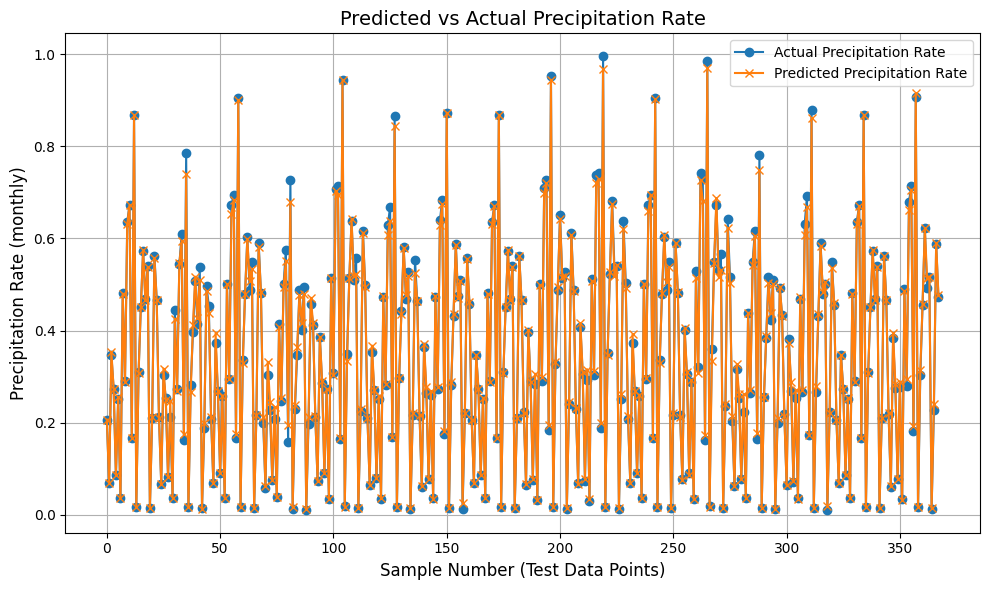

🔍 Accuracy Metrics for Precipitation Rate Prediction:
✅ R² Score (explained variance):            0.998
📉 RMSE (Root Mean Squared Error):           0.011
📊 MAE (Mean Absolute Error):                0.007
📎 MAPE (Mean Absolute Percentage Error):     2.77%
🎯 Overall Accuracy (100 - MAPE):             97.23%


In [9]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import joblib
from sklearn.model_selection import train_test_split

# Load everything
trained_models = joblib.load("trained_models.pkl")
scaler = joblib.load("scaler.pkl")
imputer = joblib.load("imputer.pkl")
full_features = joblib.load("feature_columns.pkl")

# Load historical data
df = pd.read_csv("sorted_data.csv")
df.columns = df.columns.str.upper()
df = df.sort_values(by=["NAME", "YEAR", "MONTH"]).reset_index(drop=True)

target = 'PRECIPITATION RATE'

# Get 20% sample per location
sample_df = df.groupby('NAME', group_keys=False).apply(lambda x: x.sample(frac=0.2, random_state=42)).sort_values(by=["NAME", "YEAR", "MONTH"])

actual = []
predicted = []

for _, row in sample_df.iterrows():
    name = row['NAME']
    year = row['YEAR']
    month = row['MONTH']

    location_df = df[df['NAME'] == name].reset_index(drop=True)
    idx = location_df[(location_df['YEAR'] == year) & (location_df['MONTH'] == month)].index

    if len(idx) == 0 or idx[0] < 6:
        continue  # skip if not enough history

    idx = idx[0]
    history = location_df.iloc[idx-6:idx]

    # Create features
    month_sin = np.sin(2 * np.pi * month / 12)
    month_cos = np.cos(2 * np.pi * month / 12)

    input_dict = {
        'YEAR': year,
        'MONTH_SIN': month_sin,
        'MONTH_COS': month_cos,
        'AVRG ELEVATION': row['AVRG ELEVATION'],
        'MIN ELEVATION': row['MIN ELEVATION'],
        'MAX ELEVATION': row['MAX ELEVATION']
    }

    # Fill LAG and ROLL features based on what's in full_features
    for feat in full_features:
        if 'LAG_' in feat:
            parts = feat.split('_')
            lag_num = int(parts[1])
            var = '_'.join(parts[2:])
            try:
                input_dict[feat] = history.iloc[-lag_num][var]
            except:
                input_dict[feat] = np.nan
        elif 'ROLL_MEAN_6_' in feat:
            var = feat.replace('ROLL_MEAN_6_', '')
            input_dict[feat] = history[var].mean() if var in history else np.nan
        elif feat not in input_dict:
            input_dict[feat] = row.get(feat, np.nan)

    input_df = pd.DataFrame([input_dict])
    X = imputer.transform(input_df[full_features])
    X_scaled = scaler.transform(X)

    model = trained_models[target]
    y_pred = model.predict(X_scaled)[0]

    predicted.append(y_pred)
    actual.append(row[target])

## 📊 Plot Actual vs Predicted with Better Labels
plt.figure(figsize=(10, 6))
plt.plot(actual, label="Actual Precipitation Rate", marker='o')
plt.plot(predicted, label="Predicted Precipitation Rate", marker='x')
plt.title("Predicted vs Actual Precipitation Rate", fontsize=14)
plt.xlabel("Sample Number (Test Data Points)", fontsize=12)
plt.ylabel("Precipitation Rate (monthly)", fontsize=12)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error, mean_absolute_percentage_error
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error, mean_absolute_percentage_error

# 📈 Accuracy Metrics
r2 = r2_score(actual, predicted)
rmse = mean_squared_error(actual, predicted, squared=False)
mae = mean_absolute_error(actual, predicted)
mape = mean_absolute_percentage_error(actual, predicted)
accuracy_percentage = 100 - (mape * 100)

print("🔍 Accuracy Metrics for Precipitation Rate Prediction:")
print(f"✅ R² Score (explained variance):            {r2:.3f}")
print(f"📉 RMSE (Root Mean Squared Error):           {rmse:.3f}")
print(f"📊 MAE (Mean Absolute Error):                {mae:.3f}")
print(f"📎 MAPE (Mean Absolute Percentage Error):     {mape * 100:.2f}%")
print(f"🎯 Overall Accuracy (100 - MAPE):             {accuracy_percentage:.2f}%")



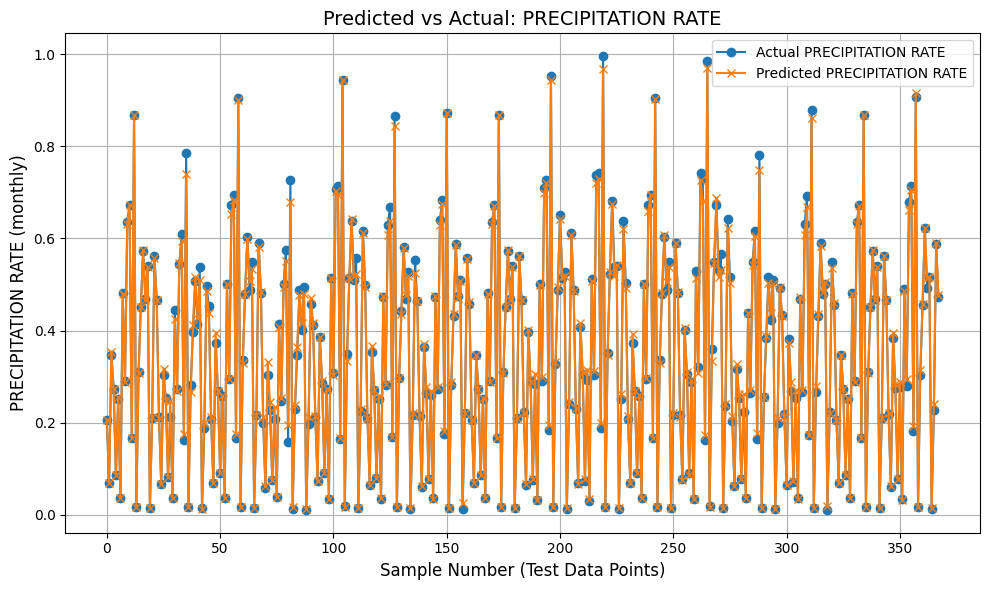


Accuracy Metrics for PRECIPITATION RATE:
R² Score (explained variance):            0.998
RMSE (Root Mean Squared Error):           0.011
MAE (Mean Absolute Error):                0.007
MAPE (Mean Absolute Percentage Error):     2.77%
Overall Accuracy (100 - MAPE):             97.23%
----------------------------------------------------------------------


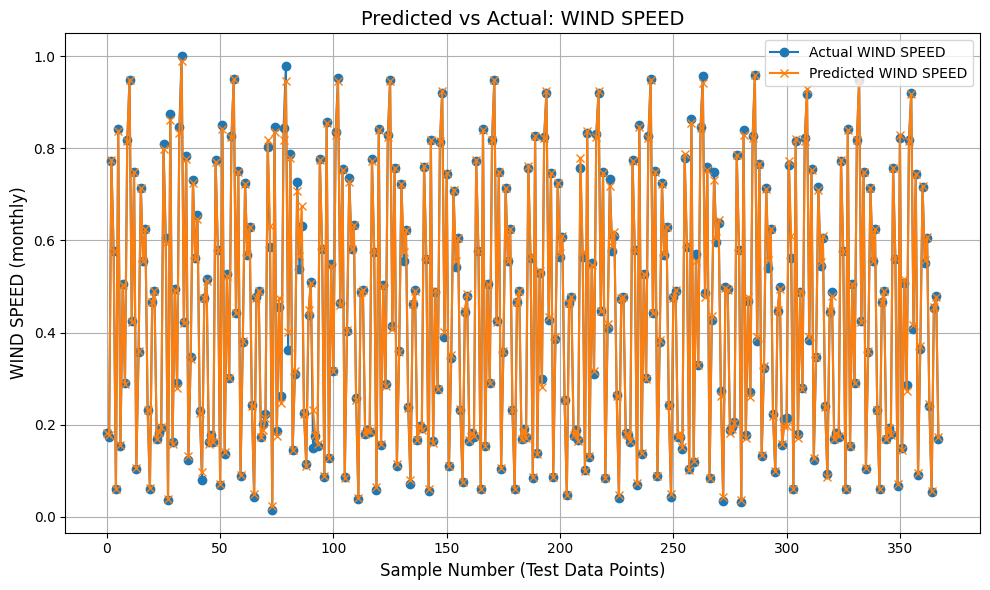


Accuracy Metrics for WIND SPEED:
R² Score (explained variance):            0.999
RMSE (Root Mean Squared Error):           0.009
MAE (Mean Absolute Error):                0.005
MAPE (Mean Absolute Percentage Error):     1.83%
Overall Accuracy (100 - MAPE):             98.17%
----------------------------------------------------------------------


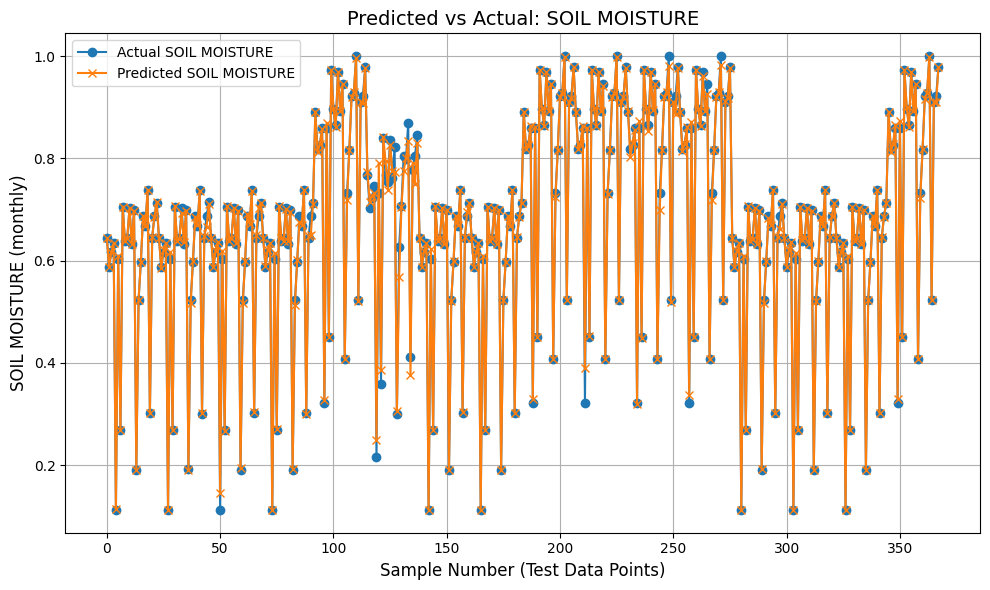


Accuracy Metrics for SOIL MOISTURE:
R² Score (explained variance):            0.998
RMSE (Root Mean Squared Error):           0.010
MAE (Mean Absolute Error):                0.004
MAPE (Mean Absolute Percentage Error):     0.75%
Overall Accuracy (100 - MAPE):             99.25%
----------------------------------------------------------------------


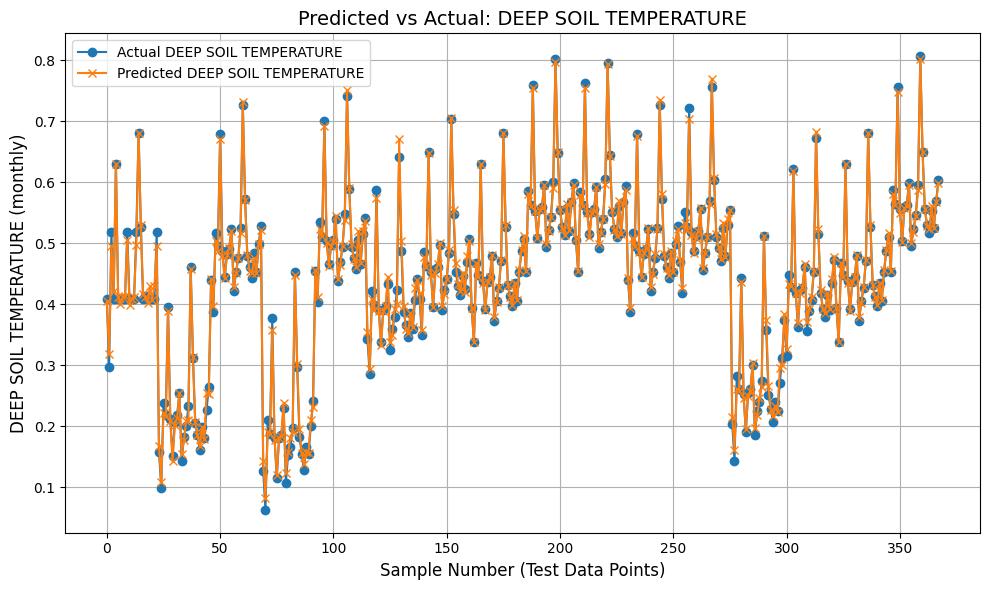


Accuracy Metrics for DEEP SOIL TEMPERATURE:
R² Score (explained variance):            0.997
RMSE (Root Mean Squared Error):           0.008
MAE (Mean Absolute Error):                0.005
MAPE (Mean Absolute Percentage Error):     1.65%
Overall Accuracy (100 - MAPE):             98.35%
----------------------------------------------------------------------


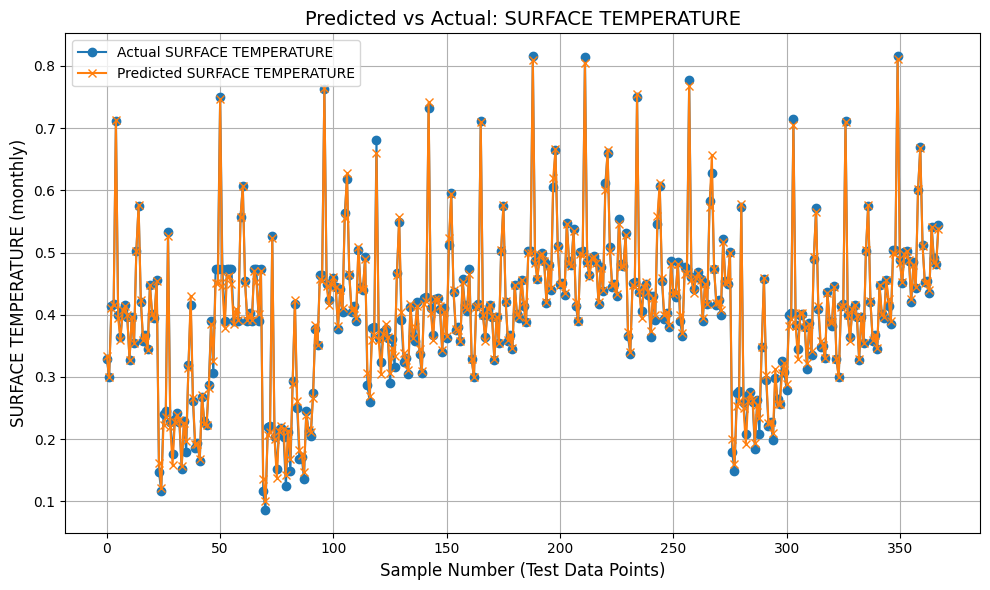


Accuracy Metrics for SURFACE TEMPERATURE:
R² Score (explained variance):            0.996
RMSE (Root Mean Squared Error):           0.008
MAE (Mean Absolute Error):                0.005
MAPE (Mean Absolute Percentage Error):     1.70%
Overall Accuracy (100 - MAPE):             98.30%
----------------------------------------------------------------------


In [11]:
targets = ['PRECIPITATION RATE', 'WIND SPEED', 'SOIL MOISTURE', 'DEEP SOIL TEMPERATURE', 'SURFACE TEMPERATURE']

for target in targets:
    actual = []
    predicted = []

    for _, row in sample_df.iterrows():
        name = row['NAME']
        year = row['YEAR']
        month = row['MONTH']

        location_df = df[df['NAME'] == name].reset_index(drop=True)
        idx = location_df[(location_df['YEAR'] == year) & (location_df['MONTH'] == month)].index

        if len(idx) == 0 or idx[0] < 6:
            continue  # skip if not enough history

        idx = idx[0]
        history = location_df.iloc[idx-6:idx]

        # Create features
        month_sin = np.sin(2 * np.pi * month / 12)
        month_cos = np.cos(2 * np.pi * month / 12)

        input_dict = {
            'YEAR': year,
            'MONTH_SIN': month_sin,
            'MONTH_COS': month_cos,
            'AVRG ELEVATION': row['AVRG ELEVATION'],
            'MIN ELEVATION': row['MIN ELEVATION'],
            'MAX ELEVATION': row['MAX ELEVATION']
        }

        # Fill LAG and ROLL features based on what's in full_features
        for feat in full_features:
            if 'LAG_' in feat:
                parts = feat.split('_')
                lag_num = int(parts[1])
                var = '_'.join(parts[2:])
                try:
                    input_dict[feat] = history.iloc[-lag_num][var]
                except:
                    input_dict[feat] = np.nan
            elif 'ROLL_MEAN_6_' in feat:
                var = feat.replace('ROLL_MEAN_6_', '')
                input_dict[feat] = history[var].mean() if var in history else np.nan
            elif feat not in input_dict:
                input_dict[feat] = row.get(feat, np.nan)

        input_df = pd.DataFrame([input_dict])
        X = imputer.transform(input_df[full_features])
        X_scaled = scaler.transform(X)

        model = trained_models[target]
        y_pred = model.predict(X_scaled)[0]

        predicted.append(y_pred)
        actual.append(row[target])

    # 📊 Plot Actual vs Predicted
    plt.figure(figsize=(10, 6))
    plt.plot(actual, label=f"Actual {target}", marker='o')
    plt.plot(predicted, label=f"Predicted {target}", marker='x')
    plt.title(f"Predicted vs Actual: {target}", fontsize=14)
    plt.xlabel("Sample Number (Test Data Points)", fontsize=12)
    plt.ylabel(f"{target} (monthly)", fontsize=12)
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # 📈 Accuracy Metrics
    r2 = r2_score(actual, predicted)
    rmse = mean_squared_error(actual, predicted, squared=False)
    mae = mean_absolute_error(actual, predicted)
    mape = mean_absolute_percentage_error(actual, predicted)
    accuracy_percentage = 100 - (mape * 100)

    print(f"\nAccuracy Metrics for {target}:")
    print(f"R² Score (explained variance):            {r2:.3f}")
    print(f"RMSE (Root Mean Squared Error):           {rmse:.3f}")
    print(f"MAE (Mean Absolute Error):                {mae:.3f}")
    print(f"MAPE (Mean Absolute Percentage Error):     {mape * 100:.2f}%")
    print(f"Overall Accuracy (100 - MAPE):             {accuracy_percentage:.2f}%")
    print("-" * 70)


In [52]:

import pandas as pd
import numpy as np

# Load forecasted data
forecast_df = pd.read_csv("forecast_10_years.csv")

# Coefficients for risk probabilities (these can be adjusted based on domain knowledge)
alpha = [0.4, 0.3, 0.2, 0.1]  # Flood Risk
beta = [0.3, 0.3, 0.2, 0.2]   # Landslide Risk
gamma = [0.4, 0.3, 0.2, 0.1]  # Storm Risk

# Define threshold for steep slope
SLOPE_THRESHOLD = 0.2  # Adjust based on terrain severity

def calculate_risk(row):
    """Calculate flood, landslide, and storm risk probabilities."""
    PR, SM, WS, ST, DST = row[['PRECIPITATION RATE', 'SOIL MOISTURE', 'WIND SPEED', 'SURFACE TEMPERATURE', 'DEEP SOIL TEMPERATURE']]
    AE, ME, MAXE = row[['AVRG ELEVATION', 'MIN ELEVATION', 'MAX ELEVATION']]
    
    # Compute slope
    slope = (MAXE - ME) / 1000  # Assuming distance ~1000m (adjust based on dataset)
    landslide_risk = beta[0] * PR + beta[1] * SM + beta[2] * DST + beta[3] * AE
    
    # Increase landslide risk if slope is steep
    if slope > SLOPE_THRESHOLD:
        landslide_risk += 0.1 * slope  # Additional risk factor based on slope severity
    
    return pd.Series({
        'Flood Risk': alpha[0] * PR + alpha[1] * SM - alpha[2] * ST - alpha[3] * AE,
        'Landslide Risk': landslide_risk,
        'Storm Risk': gamma[0] * WS + gamma[1] * PR - gamma[2] * ST - gamma[3] * AE
    })

# Apply risk calculations to each row
risk_df = forecast_df.copy()
risk_df[['Flood Risk', 'Landslide Risk', 'Storm Risk']] = forecast_df.apply(calculate_risk, axis=1)

# Save results to CSV
risk_df.to_csv("risk_forecast.csv", index=False)
print("\n✅ Risk probabilities saved to 'risk_forecast.csv'.")




✅ Risk probabilities saved to 'risk_forecast.csv'.


In [53]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler

# Load risk forecast data
risk_df = pd.read_csv("risk_forecast.csv")

# Define weights for different risks (adjustable)
weights = {
    'Flood Risk': 0.35,
    'Landslide Risk': 0.30,
    'Storm Risk': 0.25
}

# Normalize risk values per month and location
scaler = MinMaxScaler()
risk_df[['Flood Risk', 'Landslide Risk', 'Storm Risk']] = scaler.fit_transform(
    risk_df[['Flood Risk', 'Landslide Risk', 'Storm Risk']]
)

# Compute Disaster Susceptibility Index (DSI)
risk_df['Disaster Susceptibility Index'] = (
    risk_df['Flood Risk'] * weights['Flood Risk'] +
    risk_df['Landslide Risk'] * weights['Landslide Risk'] +
    risk_df['Storm Risk'] * weights['Storm Risk']
)

# Group by Year, Month, and Location (NAME) to get average DSI per location per month
dsi_df = risk_df.groupby(['YEAR', 'MONTH', 'NAME'], as_index=False)['Disaster Susceptibility Index'].mean()

# Save results
dsi_df.to_csv("disaster_susceptibility_index.csv", index=False)
print("\n✅ Disaster Susceptibility Index saved to 'disaster_susceptibility_index.csv'.")



✅ Disaster Susceptibility Index saved to 'disaster_susceptibility_index.csv'.


In [54]:
import pandas as pd

# Load Risk Forecast Data
risk_df = pd.read_csv("risk_forecast.csv")

# Load Disaster Susceptibility Index Data
dsi_df = pd.read_csv("disaster_susceptibility_index.csv")

# Merge on YEAR, MONTH, NAME
merged_df = pd.merge(risk_df, dsi_df, on=['YEAR', 'MONTH', 'NAME'], how='left')

# Save merged dataset
merged_df.to_csv("merged_risk_dsi.csv", index=False)
print("\n✅ Merged dataset saved as 'merged_risk_dsi.csv'.")



✅ Merged dataset saved as 'merged_risk_dsi.csv'.


In [55]:
import pandas as pd
import numpy as np

# Load datasets
risk_dsi_df = pd.read_csv('merged_risk_dsi.csv')  # Contains yearly & monthly DSI
plot_price_df = pd.read_csv('plot_price_DS_2.csv')  # Contains initial plot prices

# Mapping for numerical NAME values to their respective place names
name_mapping = {
    0.0625: "Alakode", 0.125: "Arakkulam", 0.1875: "Elappally",
    0.25: "Kanjikuzhy", 0.3125: "Karimkunnam", 0.375: "Karimannoor",
    0.4375: "Kodikkulam", 0.5: "Kudayathoor", 0.5625: "Kumaramangalam",
    0.625: "Manakkad", 0.6875: "Muttom", 0.75: "Purapuzha",
    0.8125: "Udumbannoor", 0.875: "Vannappuram", 0.9375: "Velliyamattom",
    1.0: "Keerikode"
}

# Convert NAME to numeric (if stored as a string)
risk_dsi_df['NAME'] = risk_dsi_df['NAME'].astype(float)
plot_price_df['NAME'] = plot_price_df['NAME'].astype(float)

# Convert plot price columns to numeric
for col in plot_price_df.columns[1:]:
    plot_price_df[col] = pd.to_numeric(plot_price_df[col], errors='coerce').replace(0, np.nan)

# Step 1: Fill NaNs using interpolation for each NAME
plot_price_df = plot_price_df.groupby('NAME', group_keys=False).apply(
    lambda group: group.interpolate(method='linear', limit_direction='both')
)

# Step 2: Fill remaining NaNs using median values
plot_price_df.fillna(plot_price_df.median(), inplace=True)

# Define yearly inflation rates (2024-2034)
inflation_rates = {
    2024: 1.048, 2025: 1.043, 2026: 1.042,
    2027: 1.041, 2028: 1.040, 2029: 1.039,
    2030: 1.038, 2031: 1.037, 2032: 1.036,
    2033: 1.035, 2034: 1.034
}

# Convert 'YEAR' and 'MONTH' to numeric
risk_dsi_df['YEAR'] = risk_dsi_df['YEAR'].astype(int)
risk_dsi_df['MONTH'] = risk_dsi_df['MONTH'].astype(int)

# Function to adjust plot prices based on DSI & inflation
def adjust_prices(name, year, month, base_prices, dsi_value):
    """Applies disaster susceptibility index (DSI) adjustment & inflation."""
    
    adjustment_factor = 1 / (1 + dsi_value)  # Inverse relation with DSI
    inflation_factor = np.prod([inflation_rates[y] for y in range(2024, year + 1)])  # Inflation over time

    new_prices = {}
    for col, price_value in base_prices.items():
        if pd.notna(price_value):  # Ignore NaNs
            new_prices[col] = float(price_value) * adjustment_factor * inflation_factor
        else:
            new_prices[col] = np.nan  # Keep structure
    return new_prices

# Create a single DataFrame to store all results
all_data = []

# Generate dataset for each month from 2024-2034
for year in range(2024, 2035):
    for month in range(1, 13):  # Loop through all months
        
        # Filter DSI values for the current year and month
        dsi_filtered = risk_dsi_df[(risk_dsi_df['YEAR'] == year) & (risk_dsi_df['MONTH'] == month)]
        
        for _, row in dsi_filtered.iterrows():
            name_num = row['NAME']
            dsi_value = row['Disaster Susceptibility Index']
            
            # Get the corresponding place name
            name_str = name_mapping.get(name_num, f"Unknown_{name_num}")

            # Extract base plot prices for NAME
            base_prices = plot_price_df[plot_price_df['NAME'] == name_num].iloc[:, 1:].squeeze()

            if base_prices.empty:
                print(f"⚠️ No base prices found for NAME: {name_str} ({name_num}) in {year}-{month}!")
                continue  # Skip missing data
            
            new_prices = adjust_prices(name_num, year, month, base_prices.to_dict(), dsi_value)

            new_row = {'NAME': name_str, 'YEAR': year, 'MONTH': month, 'DSI': dsi_value, **new_prices}
            all_data.append(new_row)

# Convert to a single DataFrame
final_df = pd.DataFrame(all_data)

# Save to a single CSV file
final_df.to_csv('future_plot_prices_with_DSI_2024_2034.csv', index=False)

print("✅ Future plot prices with DSI (with mapped names) generated successfully: future_plot_prices_with_DSI_2024_2034.csv")


C:\Users\alyng\AppData\Local\Temp\ipykernel_308\777006388.py:27: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  plot_price_df = plot_price_df.groupby('NAME', group_keys=False).apply(


✅ Future plot prices with DSI (with mapped names) generated successfully: future_plot_prices_with_DSI_2024_2034.csv


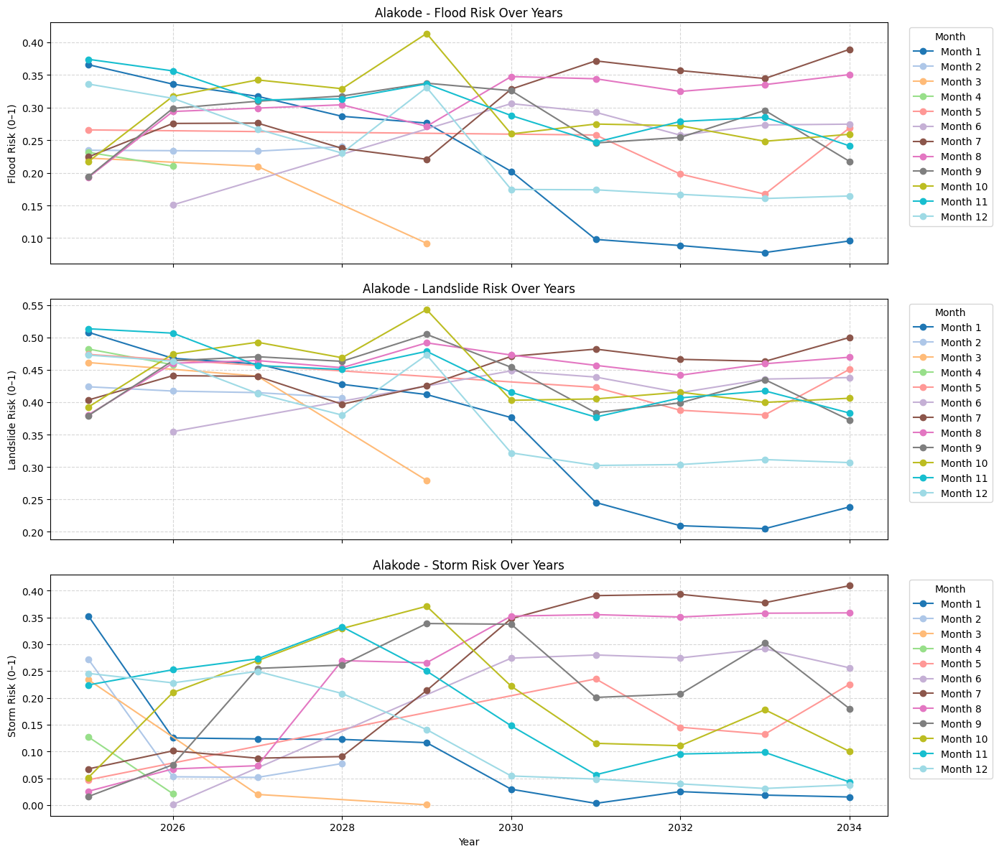

In [58]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Load dataset
risk_dsi_df = pd.read_csv("merged_risk_dsi.csv")

# Mapping for location names
name_mapping = {
    0.0625: "Alakode", 0.125: "Arakkulam", 0.1875: "Elappally",
    0.25: "Kanjikuzhy", 0.3125: "Karimkunnam", 0.375: "Karimannoor",
    0.4375: "Kodikkulam", 0.5: "Kudayathoor", 0.5625: "Kumaramangalam",
    0.625: "Manakkad", 0.6875: "Muttom", 0.75: "Purapuzha",
    0.8125: "Udumbannoor", 0.875: "Vannappuram", 0.9375: "Velliyamattom",
    1.0: "Keerikode"
}
name_to_number = {v: k for k, v in name_mapping.items()}

# Choose a location
selected_location = "Alakode"
location_code = name_to_number[selected_location]

# Filter data for the selected location
place_data = risk_dsi_df[risk_dsi_df["NAME"] == location_code].copy()

# Keep only valid risk values
for col in ["Flood Risk", "Landslide Risk", "Storm Risk"]:
    place_data = place_data[(place_data[col] >= 0) & (place_data[col] <= 1)]

# Sort
place_data = place_data.sort_values(by=["YEAR", "MONTH"])

# Define months and colors
months = range(1, 13)
colors = plt.cm.tab20(np.linspace(0, 1, 12))  # One color per month

# Risk types to plot
risk_types = ["Flood Risk", "Landslide Risk", "Storm Risk"]

# Create subplots
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(14, 12), sharex=True)

for ax, risk in zip(axes, risk_types):
    for month, color in zip(months, colors):
        month_data = place_data[place_data["MONTH"] == month]
        ax.plot(month_data["YEAR"], month_data[risk], marker='o', label=f"Month {month}", color=color)

    ax.set_ylabel(f"{risk} (0–1)")
    ax.set_title(f"{selected_location} - {risk} Over Years")
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.legend(title="Month", bbox_to_anchor=(1.02, 1), loc="upper left")

axes[-1].set_xlabel("Year")
plt.tight_layout()
plt.show()


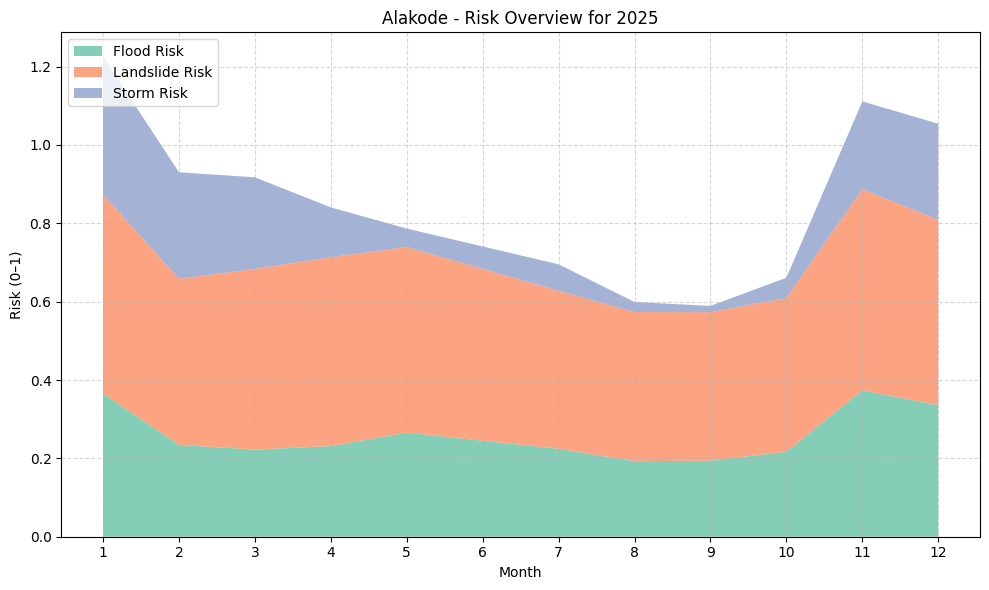

In [59]:
import pandas as pd
import matplotlib.pyplot as plt

# Load dataset
risk_dsi_df = pd.read_csv("merged_risk_dsi.csv")

# Mapping for location names
name_mapping = {
    0.0625: "Alakode", 0.125: "Arakkulam", 0.1875: "Elappally",
    0.25: "Kanjikuzhy", 0.3125: "Karimkunnam", 0.375: "Karimannoor",
    0.4375: "Kodikkulam", 0.5: "Kudayathoor", 0.5625: "Kumaramangalam",
    0.625: "Manakkad", 0.6875: "Muttom", 0.75: "Purapuzha",
    0.8125: "Udumbannoor", 0.875: "Vannappuram", 0.9375: "Velliyamattom",
    1.0: "Keerikode"
}
name_to_number = {v: k for k, v in name_mapping.items()}

# Choose location
selected_location = "Alakode"
location_code = name_to_number[selected_location]

# Filter data for selected location and year
place_data = risk_dsi_df[
    (risk_dsi_df["NAME"] == location_code) &
    (risk_dsi_df["YEAR"] == 2025)
].copy()

# Keep valid values
for col in ["Flood Risk", "Landslide Risk", "Storm Risk"]:
    place_data = place_data[(place_data[col] >= 0) & (place_data[col] <= 1)]

# Sort by month
place_data = place_data.sort_values(by="MONTH")

# Plot area chart
plt.figure(figsize=(10, 6))
plt.stackplot(
    place_data["MONTH"],
    place_data["Flood Risk"],
    place_data["Landslide Risk"],
    place_data["Storm Risk"],
    labels=["Flood Risk", "Landslide Risk", "Storm Risk"],
    colors=["#66c2a5", "#fc8d62", "#8da0cb"],
    alpha=0.8
)

plt.title(f"{selected_location} - Risk Overview for 2025")
plt.xlabel("Month")
plt.ylabel("Risk (0–1)")
plt.xticks(range(1, 13))
plt.grid(True, linestyle='--', alpha=0.5)
plt.legend(loc="upper left")
plt.tight_layout()
plt.show()


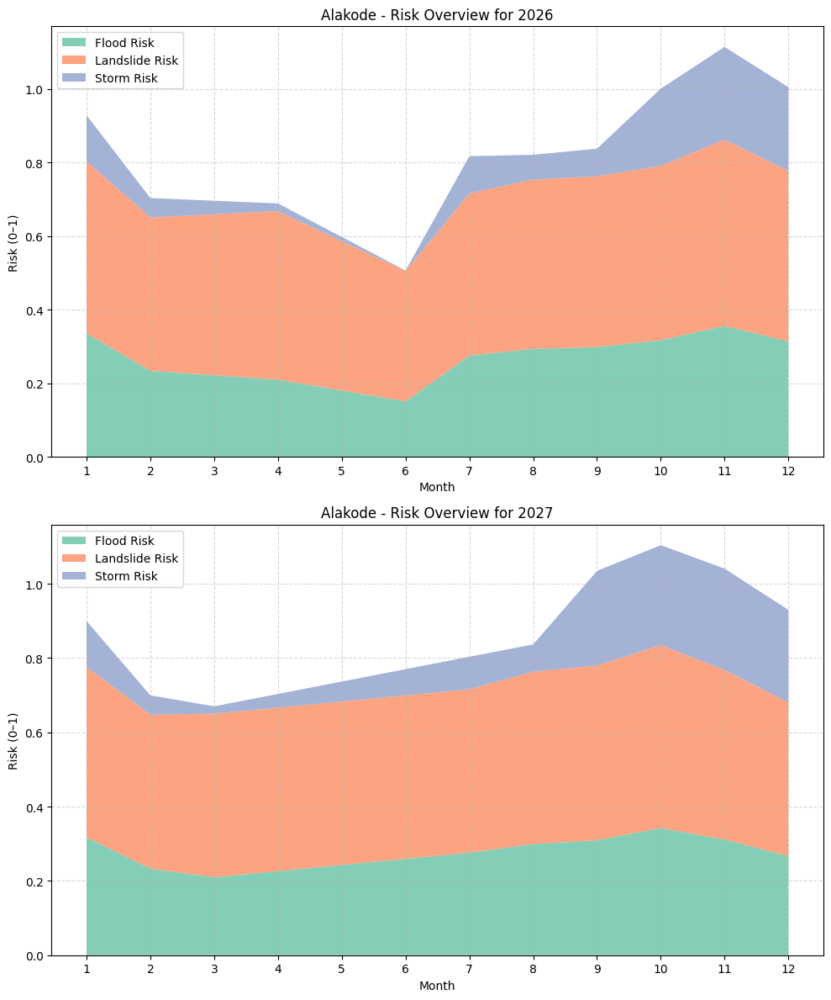

In [60]:
import pandas as pd
import matplotlib.pyplot as plt

# Load dataset
risk_dsi_df = pd.read_csv("merged_risk_dsi.csv")

# Mapping for location names
name_mapping = {
    0.0625: "Alakode", 0.125: "Arakkulam", 0.1875: "Elappally",
    0.25: "Kanjikuzhy", 0.3125: "Karimkunnam", 0.375: "Karimannoor",
    0.4375: "Kodikkulam", 0.5: "Kudayathoor", 0.5625: "Kumaramangalam",
    0.625: "Manakkad", 0.6875: "Muttom", 0.75: "Purapuzha",
    0.8125: "Udumbannoor", 0.875: "Vannappuram", 0.9375: "Velliyamattom",
    1.0: "Keerikode"
}
name_to_number = {v: k for k, v in name_mapping.items()}

# Choose location
selected_location = "Alakode"
location_code = name_to_number[selected_location]

# Define years to plot
years_to_plot = [2026, 2027]

# Set up plots
fig, axes = plt.subplots(len(years_to_plot), 1, figsize=(10, 6 * len(years_to_plot)))

if len(years_to_plot) == 1:
    axes = [axes]  # Ensure it's iterable

for i, year in enumerate(years_to_plot):
    year_data = risk_dsi_df[
        (risk_dsi_df["NAME"] == location_code) & (risk_dsi_df["YEAR"] == year)
    ].copy()
    
    for col in ["Flood Risk", "Landslide Risk", "Storm Risk"]:
        year_data = year_data[(year_data[col] >= 0) & (year_data[col] <= 1)]
    
    year_data = year_data.sort_values(by="MONTH")
    
    axes[i].stackplot(
        year_data["MONTH"],
        year_data["Flood Risk"],
        year_data["Landslide Risk"],
        year_data["Storm Risk"],
        labels=["Flood Risk", "Landslide Risk", "Storm Risk"],
        colors=["#66c2a5", "#fc8d62", "#8da0cb"],
        alpha=0.8
    )
    
    axes[i].set_title(f"{selected_location} - Risk Overview for {year}")
    axes[i].set_xlabel("Month")
    axes[i].set_ylabel("Risk (0–1)")
    axes[i].set_xticks(range(1, 13))
    axes[i].grid(True, linestyle='--', alpha=0.5)
    axes[i].legend(loc="upper left")

plt.tight_layout()
plt.show()


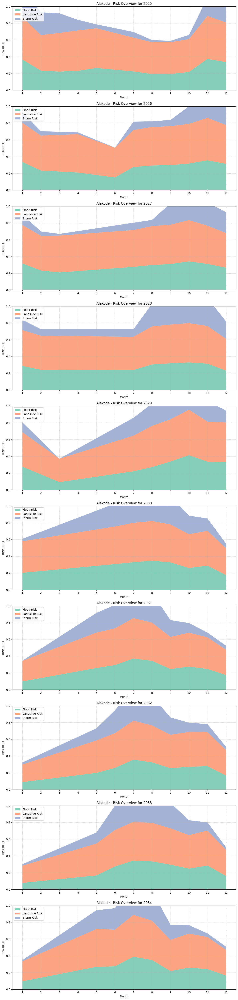

In [64]:
import pandas as pd
import matplotlib.pyplot as plt

# Load dataset
risk_dsi_df = pd.read_csv("merged_risk_dsi.csv")

# Mapping for location names
name_mapping = {
    0.0625: "Alakode", 0.125: "Arakkulam", 0.1875: "Elappally",
    0.25: "Kanjikuzhy", 0.3125: "Karimkunnam", 0.375: "Karimannoor",
    0.4375: "Kodikkulam", 0.5: "Kudayathoor", 0.5625: "Kumaramangalam",
    0.625: "Manakkad", 0.6875: "Muttom", 0.75: "Purapuzha",
    0.8125: "Udumbannoor", 0.875: "Vannappuram", 0.9375: "Velliyamattom",
    1.0: "Keerikode"
}
name_to_number = {v: k for k, v in name_mapping.items()}

# Choose location
selected_location = "Alakode"
location_code = name_to_number[selected_location]

# Define range of years to plot
years_to_plot = list(range(2025, 2035))

# Set up subplots
fig, axes = plt.subplots(len(years_to_plot), 1, figsize=(12, 5 * len(years_to_plot)))

if len(years_to_plot) == 1:
    axes = [axes]  # Ensure it's iterable

for i, year in enumerate(years_to_plot):
    year_data = risk_dsi_df[
        (risk_dsi_df["NAME"] == location_code) & (risk_dsi_df["YEAR"] == year)
    ].copy()
    
    for col in ["Flood Risk", "Landslide Risk", "Storm Risk"]:
        year_data = year_data[(year_data[col] >= 0) & (year_data[col] <= 1)]
    
    year_data = year_data.sort_values(by="MONTH")
    
    if not year_data.empty:
        axes[i].stackplot(
            year_data["MONTH"],
            year_data["Flood Risk"],
            year_data["Landslide Risk"],
            year_data["Storm Risk"],
            labels=["Flood Risk", "Landslide Risk", "Storm Risk"],
            colors=["#66c2a5", "#fc8d62", "#8da0cb"],
            alpha=0.8
        )
        axes[i].set_title(f"{selected_location} - Risk Overview for {year}")
    else:
        axes[i].set_title(f"{selected_location} - No Data for {year}")
    
    axes[i].set_xlabel("Month")
    axes[i].set_ylabel("Risk (0–1)")
    axes[i].set_xticks(range(1, 13))
    axes[i].set_ylim(0, 1)  # Set Y-axis range
    axes[i].grid(True, linestyle='--', alpha=0.5)
    axes[i].legend(loc="upper left")

plt.tight_layout()
plt.show()


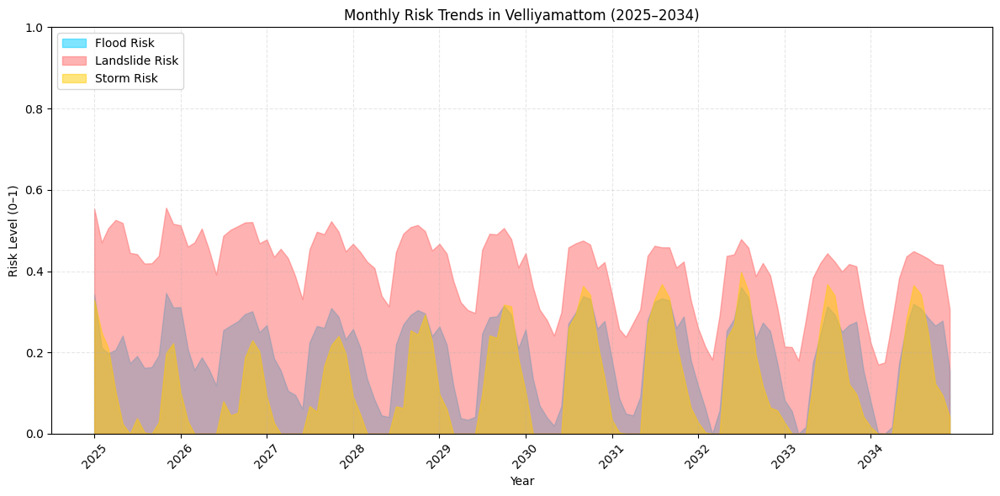

In [119]:
import pandas as pd
import matplotlib.pyplot as plt

# Load dataset
risk_dsi_df = pd.read_csv("merged_risk_dsi.csv")

# Mapping for location names
name_mapping = {
    0.0625: "Alakode", 0.125: "Arakkulam", 0.1875: "Elappally",
    0.25: "Kanjikuzhy", 0.3125: "Karimkunnam", 0.375: "Karimannoor",
    0.4375: "Kodikkulam", 0.5: "Kudayathoor", 0.5625: "Kumaramangalam",
    0.625: "Manakkad", 0.6875: "Muttom", 0.75: "Purapuzha",
    0.8125: "Udumbannoor", 0.875: "Vannappuram", 0.9375: "Velliyamattom",
    1.0: "Keerikode"
}
name_to_number = {v: k for k, v in name_mapping.items()}

# Select location and years
selected_location = "Velliyamattom"
location_code = name_to_number[selected_location]
years_to_plot = list(range(2025, 2035))

# Filter and clean data
place_data = risk_dsi_df[
    (risk_dsi_df["NAME"] == location_code) &
    (risk_dsi_df["YEAR"].isin(years_to_plot))
].copy()

for col in ["Flood Risk", "Landslide Risk", "Storm Risk"]:
    place_data[col] = place_data[col].clip(0, 1)

place_data["Date"] = pd.to_datetime(place_data["YEAR"].astype(str) + '-' + place_data["MONTH"].astype(str))

# Plot
plt.figure(figsize=(12, 6))

plt.fill_between(place_data["Date"], 0, place_data["Flood Risk"], color="#00ccff", alpha=0.5, label="Flood Risk")
plt.fill_between(place_data["Date"], 0, place_data["Landslide Risk"], color="#ff6666", alpha=0.5, label="Landslide Risk")
plt.fill_between(place_data["Date"], 0, place_data["Storm Risk"], color="#ffcc00", alpha=0.5, label="Storm Risk")

# Customize plot
plt.ylim(0, 1)
plt.xlabel("Year")
plt.ylabel("Risk Level (0–1)")
plt.title(f"Monthly Risk Trends in {selected_location} (2025–2034)")
plt.grid(True, linestyle="--", alpha=0.3)
plt.legend(loc="upper left")

# X-axis: show only the year
plt.xticks(
    ticks=pd.date_range(start="2025-01", end="2034-12", freq='YS'),
    labels=[str(y) for y in range(2025, 2035)],
    rotation=45
)

plt.tight_layout()

# Save the plot as a PNG file
filename = f"{selected_location.lower()}_risk_trends_2025_2034.jpeg"
plt.savefig(filename, dpi=300)
plt.show()


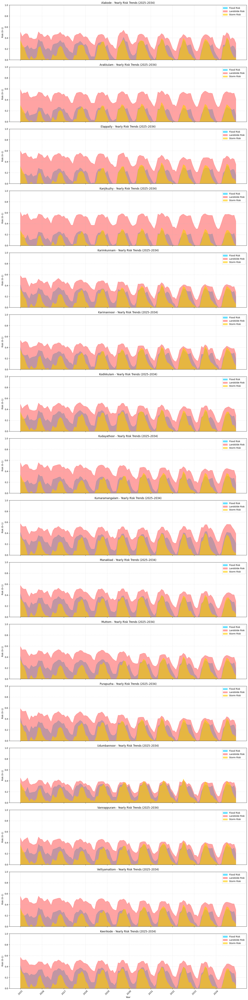

In [80]:
import pandas as pd
import matplotlib.pyplot as plt

# Load dataset
risk_dsi_df = pd.read_csv("merged_risk_dsi.csv")

# Mapping for location names
name_mapping = {
    0.0625: "Alakode", 0.125: "Arakkulam", 0.1875: "Elappally",
    0.25: "Kanjikuzhy", 0.3125: "Karimkunnam", 0.375: "Karimannoor",
    0.4375: "Kodikkulam", 0.5: "Kudayathoor", 0.5625: "Kumaramangalam",
    0.625: "Manakkad", 0.6875: "Muttom", 0.75: "Purapuzha",
    0.8125: "Udumbannoor", 0.875: "Vannappuram", 0.9375: "Velliyamattom",
    1.0: "Keerikode"
}
number_to_name = name_mapping

# Years to include
years_to_plot = list(range(2025, 2035))
risk_dsi_df = risk_dsi_df[risk_dsi_df["YEAR"].isin(years_to_plot)].copy()

# Clip outliers
for col in ["Flood Risk", "Landslide Risk", "Storm Risk"]:
    risk_dsi_df[col] = risk_dsi_df[col].clip(0, 1)

# Create date column for plotting
risk_dsi_df["Date"] = pd.to_datetime(risk_dsi_df["YEAR"].astype(str) + "-" + risk_dsi_df["MONTH"].astype(str))

# Plot setup
num_places = len(number_to_name)
fig, axes = plt.subplots(num_places, 1, figsize=(16, 4 * num_places), sharex=True)

if num_places == 1:
    axes = [axes]

# Plot for each location
for idx, (code, place_name) in enumerate(number_to_name.items()):
    place_data = risk_dsi_df[risk_dsi_df["NAME"] == code].copy()

    axes[idx].fill_between(place_data["Date"], 0, place_data["Flood Risk"], color="#00ccff", alpha=0.6, label="Flood Risk")
    axes[idx].fill_between(place_data["Date"], 0, place_data["Landslide Risk"], color="#ff6666", alpha=0.6, label="Landslide Risk")
    axes[idx].fill_between(place_data["Date"], 0, place_data["Storm Risk"], color="#ffcc00", alpha=0.6, label="Storm Risk")

    axes[idx].set_ylim(0, 1)
    axes[idx].set_ylabel("Risk (0–1)")
    axes[idx].set_title(f"{place_name} - Yearly Risk Trends (2025–2034)")
    axes[idx].legend(loc="upper right")
    axes[idx].grid(True, linestyle='--', alpha=0.4)

# X-axis: show only the year
plt.xticks(
    ticks=pd.date_range(start="2025-01", end="2034-12", freq='YS'),
    labels=[str(y) for y in range(2025, 2035)],
    rotation=45
)

axes[-1].set_xticks(year_ticks)
axes[-1].set_xticklabels(year_labels, rotation=45)
axes[-1].set_xlabel("Year")  # X-axis label

plt.tight_layout()
plt.show()


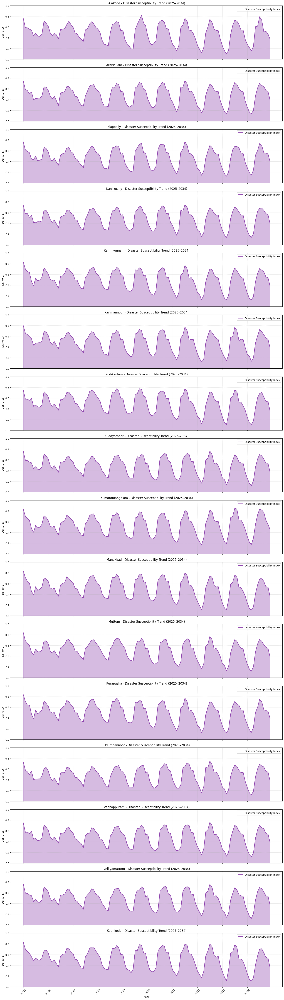

In [81]:
import pandas as pd
import matplotlib.pyplot as plt

# Load dataset
risk_dsi_df = pd.read_csv("merged_risk_dsi.csv")

# Mapping for location names
name_mapping = {
    0.0625: "Alakode", 0.125: "Arakkulam", 0.1875: "Elappally",
    0.25: "Kanjikuzhy", 0.3125: "Karimkunnam", 0.375: "Karimannoor",
    0.4375: "Kodikkulam", 0.5: "Kudayathoor", 0.5625: "Kumaramangalam",
    0.625: "Manakkad", 0.6875: "Muttom", 0.75: "Purapuzha",
    0.8125: "Udumbannoor", 0.875: "Vannappuram", 0.9375: "Velliyamattom",
    1.0: "Keerikode"
}
number_to_name = name_mapping

# Filter for target years
years_to_plot = list(range(2025, 2035))
risk_dsi_df = risk_dsi_df[risk_dsi_df["YEAR"].isin(years_to_plot)].copy()

# Use full name column: "Disaster Susceptibility Index"
if "Disaster Susceptibility Index" in risk_dsi_df.columns:
    risk_dsi_df["Disaster Susceptibility Index"] = risk_dsi_df["Disaster Susceptibility Index"].clip(0, 1)
else:
    raise ValueError("The column 'Disaster Susceptibility Index' was not found in the dataset.")

# Create a date column for x-axis
risk_dsi_df["Date"] = pd.to_datetime(risk_dsi_df["YEAR"].astype(str) + "-" + risk_dsi_df["MONTH"].astype(str))

# Setup plots
num_places = len(number_to_name)
fig, axes = plt.subplots(num_places, 1, figsize=(16, 3.5 * num_places), sharex=True)

if num_places == 1:
    axes = [axes]

# Plot DSI for each location
for idx, (code, place_name) in enumerate(number_to_name.items()):
    place_data = risk_dsi_df[risk_dsi_df["NAME"] == code].copy()

    axes[idx].plot(place_data["Date"], place_data["Disaster Susceptibility Index"],
                   color="#8e44ad", linewidth=2, label="Disaster Susceptibility Index")
    axes[idx].fill_between(place_data["Date"], 0, place_data["Disaster Susceptibility Index"],
                           color="#bb8fce", alpha=0.6)

    axes[idx].set_ylim(0, 1)
    axes[idx].set_ylabel("DSI (0–1)")
    axes[idx].set_title(f"{place_name} - Disaster Susceptibility Trend (2025–2034)")
    axes[idx].legend(loc="upper right")
    axes[idx].grid(True, linestyle="--", alpha=0.3)

# Format X-axis with yearly ticks
year_ticks = pd.date_range(start="2025-01-01", end="2034-01-01", freq="YS")
axes[-1].set_xticks(year_ticks)
axes[-1].set_xticklabels([str(d.year) for d in year_ticks], rotation=45)
axes[-1].set_xlabel("Year")

plt.tight_layout()
plt.show()


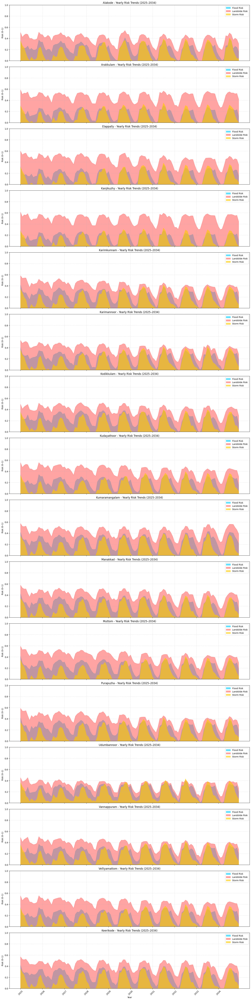

In [85]:
import pandas as pd
import matplotlib.pyplot as plt

# Load dataset
risk_dsi_df = pd.read_csv("merged_risk_dsi.csv")

# Mapping for location names
name_mapping = {
    0.0625: "Alakode", 0.125: "Arakkulam", 0.1875: "Elappally",
    0.25: "Kanjikuzhy", 0.3125: "Karimkunnam", 0.375: "Karimannoor",
    0.4375: "Kodikkulam", 0.5: "Kudayathoor", 0.5625: "Kumaramangalam",
    0.625: "Manakkad", 0.6875: "Muttom", 0.75: "Purapuzha",
    0.8125: "Udumbannoor", 0.875: "Vannappuram", 0.9375: "Velliyamattom",
    1.0: "Keerikode"
}
number_to_name = name_mapping

# Filter for required years
years_to_plot = list(range(2025, 2035))
risk_dsi_df = risk_dsi_df[risk_dsi_df["YEAR"].isin(years_to_plot)].copy()

# Clip outliers
for col in ["Flood Risk", "Landslide Risk", "Storm Risk"]:
    risk_dsi_df[col] = risk_dsi_df[col].clip(0, 1)

# Create date column
risk_dsi_df["Date"] = pd.to_datetime(risk_dsi_df["YEAR"].astype(str) + "-" + risk_dsi_df["MONTH"].astype(str))

# Plot setup
num_places = len(number_to_name)
fig, axes = plt.subplots(
    num_places, 1,
    figsize=(16, 4 * num_places),
    sharex=True,
    constrained_layout=True  # Ensures spacing so labels are not clipped
)

if num_places == 1:
    axes = [axes]

# X-axis tick setup
year_ticks = pd.date_range(start="2025-01-01", end="2034-01-01", freq="YS")
year_labels = [str(d.year) for d in year_ticks]

# Plot for each location
for idx, (code, place_name) in enumerate(number_to_name.items()):
    place_data = risk_dsi_df[risk_dsi_df["NAME"] == code].copy()

    axes[idx].fill_between(place_data["Date"], 0, place_data["Flood Risk"], color="#00ccff", alpha=0.6, label="Flood Risk")
    axes[idx].fill_between(place_data["Date"], 0, place_data["Landslide Risk"], color="#ff6666", alpha=0.6, label="Landslide Risk")
    axes[idx].fill_between(place_data["Date"], 0, place_data["Storm Risk"], color="#ffcc00", alpha=0.6, label="Storm Risk")

    axes[idx].set_ylim(0, 1)
    axes[idx].set_ylabel("Risk (0–1)")
    axes[idx].set_title(f"{place_name} - Yearly Risk Trends (2025–2034)")
    axes[idx].legend(loc="upper right")
    axes[idx].grid(True, linestyle='--', alpha=0.4)

    # Set ticks and labels
    axes[idx].set_xticks(year_ticks)
    axes[idx].set_xticklabels(year_labels, rotation=45)

# Label only the bottom plot with x-axis
axes[-1].set_xlabel("Year")

# Save as PNG
plt.savefig("risk_trends.png", dpi=300)

# Show the plot
plt.show()


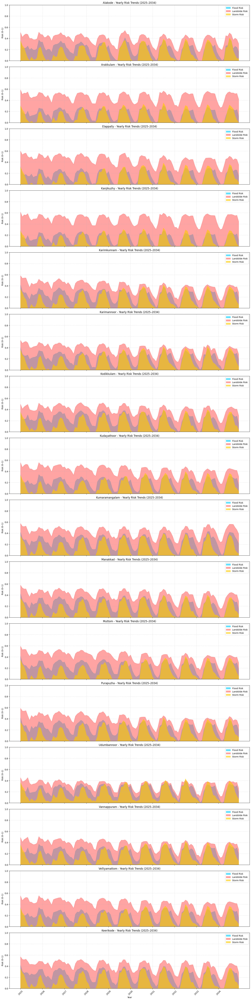

In [87]:
import pandas as pd
import matplotlib.pyplot as plt

# Load dataset
risk_dsi_df = pd.read_csv("merged_risk_dsi.csv")

# Mapping for location names
name_mapping = {
    0.0625: "Alakode", 0.125: "Arakkulam", 0.1875: "Elappally",
    0.25: "Kanjikuzhy", 0.3125: "Karimkunnam", 0.375: "Karimannoor",
    0.4375: "Kodikkulam", 0.5: "Kudayathoor", 0.5625: "Kumaramangalam",
    0.625: "Manakkad", 0.6875: "Muttom", 0.75: "Purapuzha",
    0.8125: "Udumbannoor", 0.875: "Vannappuram", 0.9375: "Velliyamattom",
    1.0: "Keerikode"
}
number_to_name = name_mapping

# Filter for required years
years_to_plot = list(range(2025, 2035))
risk_dsi_df = risk_dsi_df[risk_dsi_df["YEAR"].isin(years_to_plot)].copy()

# Clip outliers
for col in ["Flood Risk", "Landslide Risk", "Storm Risk"]:
    risk_dsi_df[col] = risk_dsi_df[col].clip(0, 1)

# Create date column
risk_dsi_df["Date"] = pd.to_datetime(risk_dsi_df["YEAR"].astype(str) + "-" + risk_dsi_df["MONTH"].astype(str))

# Plot setup
num_places = len(number_to_name)
fig, axes = plt.subplots(
    num_places, 1,
    figsize=(16, 4 * num_places),
    sharex=True,
    constrained_layout=True  # Ensures spacing so labels are not clipped
)

if num_places == 1:
    axes = [axes]

# X-axis tick setup
year_ticks = pd.date_range(start="2025-01-01", end="2034-01-01", freq="YS")
year_labels = [str(d.year) for d in year_ticks]

# Plot for each location
for idx, (code, place_name) in enumerate(number_to_name.items()):
    place_data = risk_dsi_df[risk_dsi_df["NAME"] == code].copy()

    axes[idx].fill_between(place_data["Date"], 0, place_data["Flood Risk"], color="#00ccff", alpha=0.6, label="Flood Risk")
    axes[idx].fill_between(place_data["Date"], 0, place_data["Landslide Risk"], color="#ff6666", alpha=0.6, label="Landslide Risk")
    axes[idx].fill_between(place_data["Date"], 0, place_data["Storm Risk"], color="#ffcc00", alpha=0.6, label="Storm Risk")

    axes[idx].set_ylim(0, 1)
    axes[idx].set_ylabel("Risk (0–1)")
    axes[idx].set_title(f"{place_name} - Yearly Risk Trends (2025–2034)")
    axes[idx].legend(loc="upper right")
    axes[idx].grid(True, linestyle='--', alpha=0.4)

    # Set ticks and labels
    axes[idx].set_xticks(year_ticks)
    axes[idx].set_xticklabels(year_labels, rotation=45)

# Label only the bottom plot with x-axis
axes[-1].set_xlabel("Year")

# Save as PNG
plt.savefig("risk_trends.png", dpi=300)

# Show the plot
plt.show()


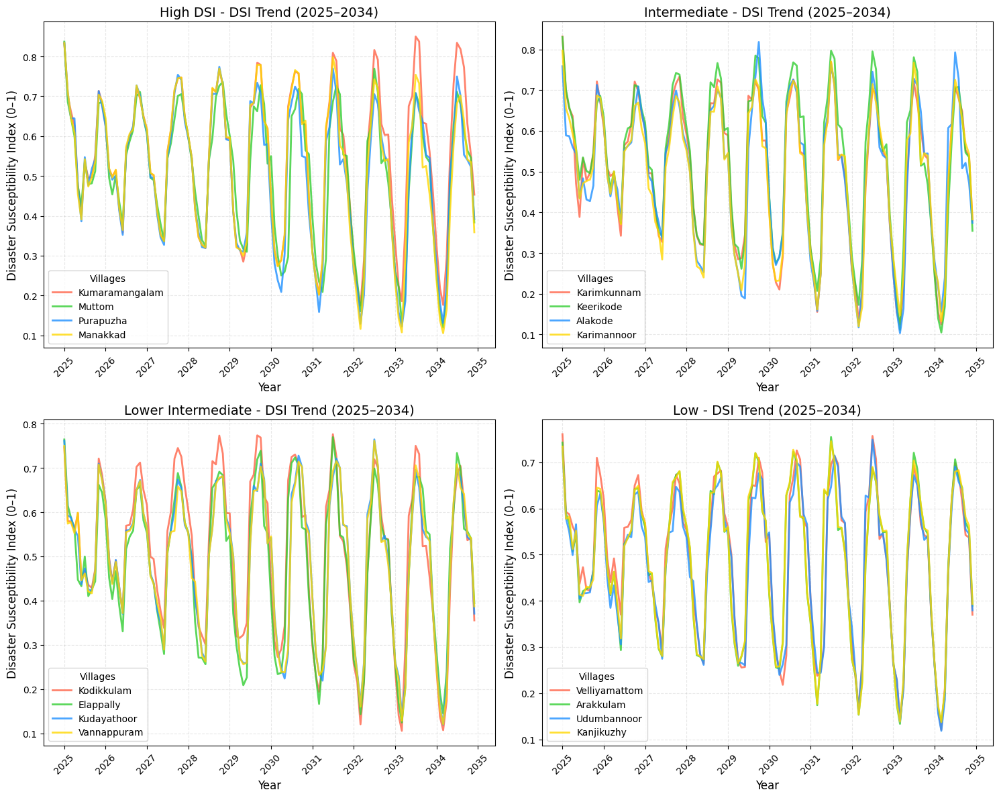

In [138]:
import pandas as pd
import matplotlib.pyplot as plt

# Load dataset
risk_dsi_df = pd.read_csv("merged_risk_dsi.csv")

# Mapping for location names
name_mapping = {
    0.0625: "Alakode", 0.125: "Arakkulam", 0.1875: "Elappally",
    0.25: "Kanjikuzhy", 0.3125: "Karimkunnam", 0.375: "Karimannoor",
    0.4375: "Kodikkulam", 0.5: "Kudayathoor", 0.5625: "Kumaramangalam",
    0.625: "Manakkad", 0.6875: "Muttom", 0.75: "Purapuzha",
    0.8125: "Udumbannoor", 0.875: "Vannappuram", 0.9375: "Velliyamattom",
    1.0: "Keerikode"
}

# Filter for target years
years_to_plot = list(range(2025, 2035))
risk_dsi_df = risk_dsi_df[risk_dsi_df["YEAR"].isin(years_to_plot)].copy()

# Use full name column: "Disaster Susceptibility Index"
if "Disaster Susceptibility Index" in risk_dsi_df.columns:
    risk_dsi_df["Disaster Susceptibility Index"] = risk_dsi_df["Disaster Susceptibility Index"].clip(0, 1)
else:
    raise ValueError("The column 'Disaster Susceptibility Index' was not found in the dataset.")

# Create a date column for x-axis
risk_dsi_df["Date"] = pd.to_datetime(risk_dsi_df["YEAR"].astype(str) + "-" + risk_dsi_df["MONTH"].astype(str))

# Step 1: Find the highest DSI value for each village (not averaging)
max_dsi_per_village = risk_dsi_df.groupby("NAME")["Disaster Susceptibility Index"].max()

# Step 2: Sort villages by their highest DSI values
sorted_villages = max_dsi_per_village.sort_values(ascending=False)

# Step 3: Group sorted villages into four categories based on DSI rankings
categories = {
    "High DSI": sorted_villages.iloc[:4],  # Top 4 villages
    "Intermediate": sorted_villages.iloc[4:8],  # Next 4 villages
    "Lower Intermediate": sorted_villages.iloc[8:12],  # Next 4 villages
    "Low": sorted_villages.iloc[12:16]  # Last 4 villages
}

# Step 4: Define bright colors for each village
bright_colors = ['#FF6347', '#32CD32', '#1E90FF', '#FFD700']  # Bright Red, Green, Blue, Yellow

# Step 5: Plot the DSI values for each village, separated by classification
fig, axes = plt.subplots(2, 2, figsize=(15, 12))

# Flatten the axes array for easier indexing
axes = axes.flatten()

# Plot each classification group in a separate subplot
for idx, (category, villages) in enumerate(categories.items()):
    ax = axes[idx]
    
    # Assign a unique bright color for each village
    for i, village_code in enumerate(villages.index):
        place_data = risk_dsi_df[risk_dsi_df["NAME"] == village_code].copy()
        # Use the ith bright color from the list
        color = bright_colors[i % len(bright_colors)]
        
        # Plot line graph (ax.plot)
        ax.plot(place_data["Date"], place_data["Disaster Susceptibility Index"], 
                color=color, alpha=0.8, label=name_mapping[village_code], linewidth=2)
    
    ax.set_title(f"{category} - DSI Trend (2025–2034)", fontsize=14)
    ax.set_xlabel("Year", fontsize=12)
    ax.set_ylabel("Disaster Susceptibility Index (0–1)", fontsize=12)
    ax.legend(title="Villages", fontsize=10)
    ax.grid(True, linestyle="--", alpha=0.3)
    ax.tick_params(axis='x', rotation=45)

    # Save each graph as a separate file
    ax_filename = f"dsi_trends_{category.replace(' ', '_')}_line_graph.jpg"
    ax.figure.savefig(ax_filename, format='jpg')

# Show the plot
plt.tight_layout()
plt.show()


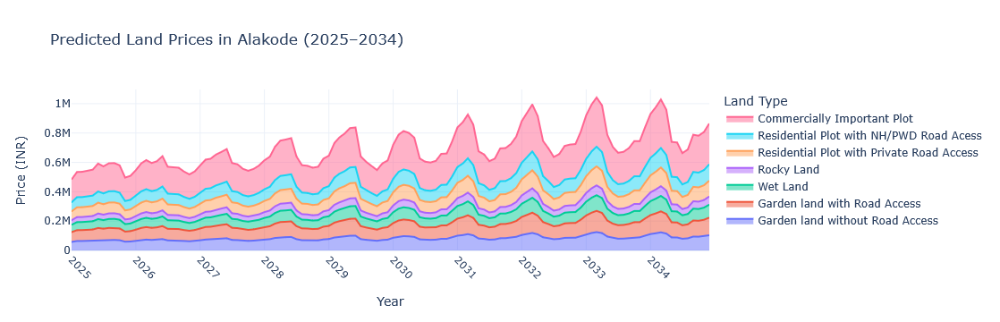

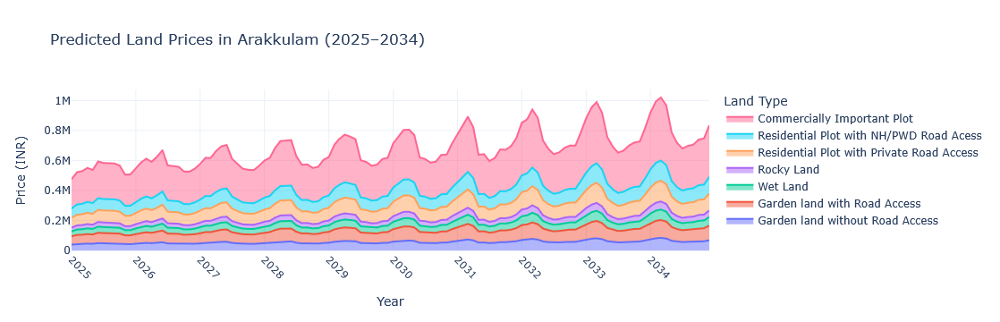

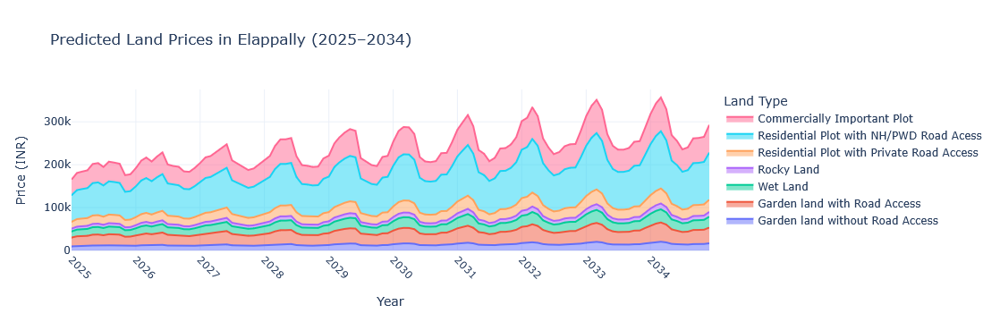

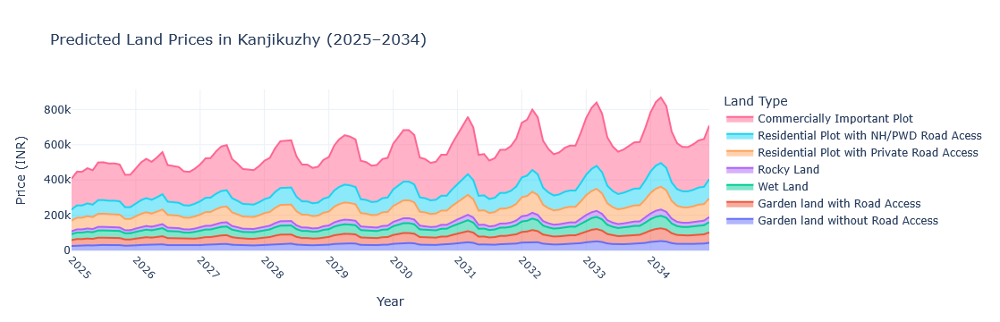

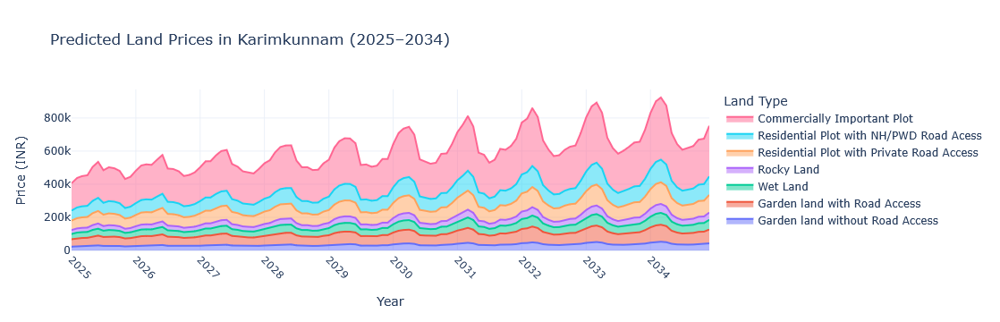

...

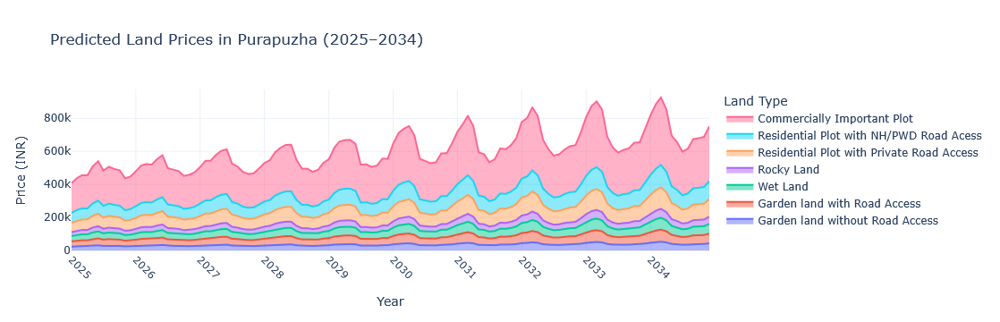

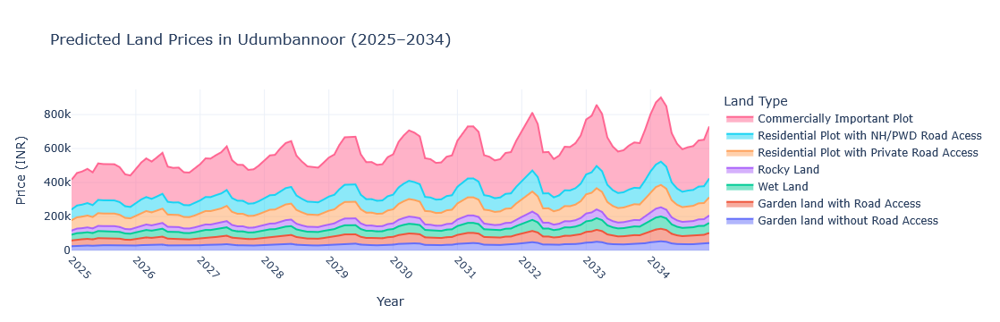

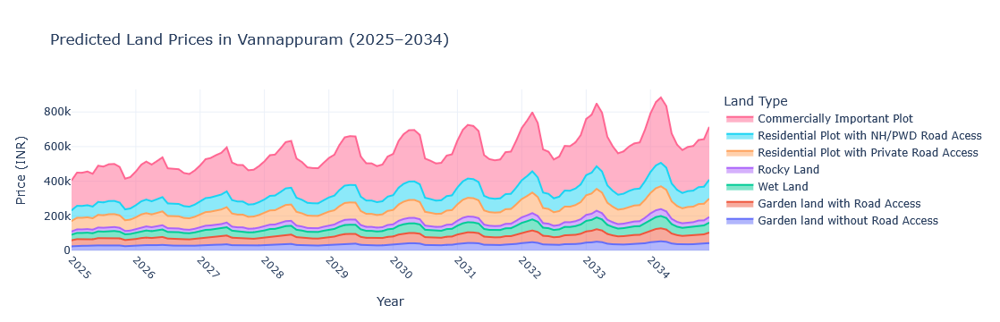

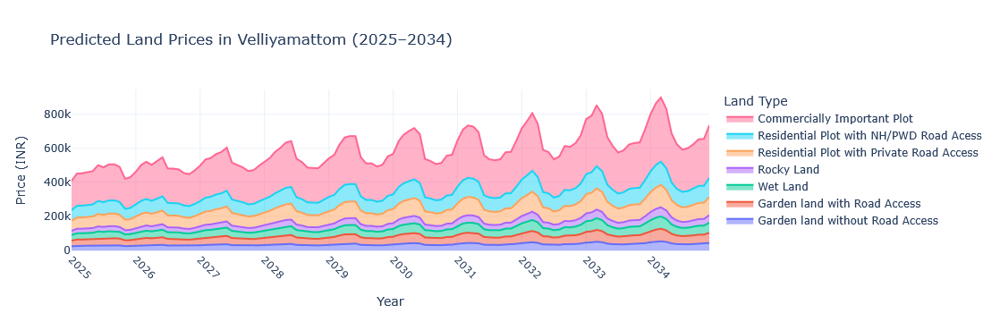

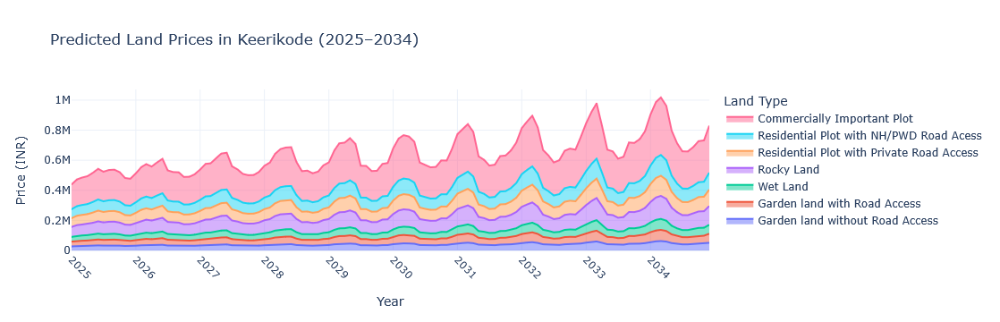

In [146]:
import pandas as pd
import plotly.graph_objects as go

# Load data
df = pd.read_csv("future_plot_prices_with_DSI_2024_2034.csv")

# Define years and land types
years_to_plot = list(range(2025, 2035))
land_types = [
    'Garden land without Road Access',
    'Garden land with Road Access',
    'Wet Land',
    'Rocky Land',
    'Residential Plot with Private Road Access',
    'Residential Plot with NH/PWD Road Acess',
    'Commercially Important Plot'
]

# Strip spaces in location names
df["NAME"] = df["NAME"].str.strip()

# Generate plots for each place
for location in df["NAME"].unique():
    df_filtered = df[
        (df["NAME"] == location) &
        (df["YEAR"].isin(years_to_plot))
    ].copy()

    df_filtered["Date"] = pd.to_datetime(df_filtered["YEAR"].astype(str) + '-' + df_filtered["MONTH"].astype(str))
    df_filtered = df_filtered.sort_values("Date")

    fig = go.Figure()

    for land_type in land_types:
        fig.add_trace(go.Scatter(
            x=df_filtered["Date"],
            y=df_filtered[land_type],
            mode='lines',
            stackgroup='one',
            name=land_type
        ))

    fig.update_layout(
        title=f"Predicted Land Prices in {location} (2025–2034)",
        xaxis_title="Year",
        yaxis_title="Price (INR)",
        xaxis=dict(
            tickformat="%Y",
            dtick="M12",
            tickangle=45
        ),
        legend_title="Land Type",
        hovermode="x unified",
        template="plotly_white"
    )

    fig.show()
